### **DS250 Assignment : (3a)**
- **Animesh Raj : 11940120**
- **Puja Bansal : 11940910**

# Import libraries

In [834]:
import pandas as pd
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import altair as alt
import numpy as np
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
import xgboost as xgb
from sklearn import linear_model
from sklearn.neural_network import MLPRegressor
from sklearn import ensemble
from sklearn.svm import SVR
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
import sklearn.metrics as metrics

# Daily Data-set

In [835]:
df_d = pd.read_csv('Daily_Gold_Price_on_World.csv')
df_d.head()

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-01,226.00,137.06,0.00,110.70,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.00
1,1979-01-02,226.80,137.29,43164.91,111.45,263.74,359.62,1792.85,0.0,0.0,735.60,138160.45,851.29,4454.55,0.0,0.0,107470.04,0.0,194.56,193.61
2,1979-01-03,218.60,134.01,43717.90,107.98,264.39,365.87,1802.15,0.0,0.0,739.42,138877.01,855.71,4477.66,0.0,0.0,108027.43,0.0,192.23,192.97
3,1979-01-04,223.15,136.79,43674.89,110.66,264.14,366.38,1811.74,0.0,0.0,743.36,139616.26,860.26,4501.49,0.0,0.0,108602.47,0.0,193.01,194.55
4,1979-01-05,225.50,138.35,44582.47,111.63,268.39,373.72,1843.57,0.0,0.0,756.42,142069.10,875.38,4580.57,0.0,0.0,110510.44,0.0,196.40,197.94


In [836]:
df_d.shape

(11270, 20)

In [837]:
df_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11270 entries, 0 to 11269
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      11270 non-null  object 
 1   US dollar (USD)           11270 non-null  float64
 2   Euro (EUR)                11270 non-null  float64
 3   Japanese yen (JPY)        11270 non-null  float64
 4   Pound sterling (GBP)      11270 non-null  float64
 5   Canadian dollar (CAD)     11270 non-null  float64
 6   Swiss franc (CHF)         11270 non-null  float64
 7   Indian rupee (INR)        11270 non-null  float64
 8   Chinese renmimbi (CNY)    11270 non-null  float64
 9   Turkish lira (TRY)        11270 non-null  float64
 10  Saudi riyal (SAR)         11270 non-null  float64
 11  Indonesian rupiah (IDR)   11270 non-null  float64
 12  UAE dirham (AED)          11270 non-null  float64
 13  Thai baht THB)            11270 non-null  float64
 14  Vietna

In [838]:
df_d.describe()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
count,11270.000000,11270.000000,11270.000000,11270.000000,11270.000000,11270.000000,11270.000000,11270.000000,11270.000000,11270.000000,1.127000e+04,11270.000000,11270.000000,1.127000e+04,11270.000000,1.127000e+04,11270.000000,11270.000000,11270.000000
mean,708.802883,586.989087,84627.852592,462.797673,862.681076,838.499828,34496.840336,4292.942672,1838.319990,2636.998319,6.466069e+06,2604.855909,22168.546564,1.164399e+07,5502.923864,7.372459e+05,25066.226152,6244.925312,891.357531
std,488.387057,397.153707,46451.958291,360.349245,568.612953,377.586372,37750.923850,3578.920831,3716.523247,1843.747218,7.618049e+06,1793.139129,16126.891301,1.321309e+07,8035.554192,5.993235e+05,36645.417913,7713.512622,600.491022
min,216.850000,133.830000,0.000000,107.980000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,353.250000,306.482500,42924.465000,217.525000,456.477500,500.627500,6278.672500,1725.360000,0.840000,1309.347500,7.019197e+05,1297.097500,9622.702500,0.000000e+00,944.972500,3.018853e+05,0.000000,980.085000,475.662500
50%,418.850000,368.690000,72307.260000,257.720000,535.065000,710.210000,13277.470000,3041.750000,177.040000,1532.930000,2.611427e+06,1540.840000,12280.965000,4.266991e+06,1307.980000,3.804761e+05,7710.985000,1957.050000,553.855000
75%,1189.325000,963.527500,127195.917500,762.462500,1359.500000,1153.577500,67818.072500,7562.680000,2387.820000,4460.175000,1.286221e+07,4368.537500,39353.925000,2.545821e+07,8419.380000,1.321604e+06,41796.782500,10306.390000,1385.632500
max,2067.150000,1874.560000,235714.190000,1572.810000,2749.310000,1894.280000,156815.690000,14355.530000,32423.220000,7752.230000,3.014938e+07,7592.950000,67625.090000,4.790413e+07,33033.050000,2.522509e+06,300113.920000,36231.960000,2863.290000


Replace all 0 with NaN

In [839]:
df_d.replace(0, np.nan, inplace=True)
df_d.head()

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-01,226.00,137.06,NaN,110.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1979-01-02,226.80,137.29,43164.91,111.45,263.74,359.62,1792.85,NaN,NaN,735.60,138160.45,851.29,4454.55,NaN,NaN,107470.04,NaN,194.56,193.61
2,1979-01-03,218.60,134.01,43717.90,107.98,264.39,365.87,1802.15,NaN,NaN,739.42,138877.01,855.71,4477.66,NaN,NaN,108027.43,NaN,192.23,192.97
3,1979-01-04,223.15,136.79,43674.89,110.66,264.14,366.38,1811.74,NaN,NaN,743.36,139616.26,860.26,4501.49,NaN,NaN,108602.47,NaN,193.01,194.55
4,1979-01-05,225.50,138.35,44582.47,111.63,268.39,373.72,1843.57,NaN,NaN,756.42,142069.10,875.38,4580.57,NaN,NaN,110510.44,NaN,196.40,197.94


Imputation using forward and backward fill

In [840]:
df_d1 = df_d.copy()
df_d = df_d.fillna(method='ffill').fillna(method='bfill')
df_d.head()

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-01,226.00,137.06,43164.91,110.70,263.74,359.62,1792.85,835.8,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1,1979-01-02,226.80,137.29,43164.91,111.45,263.74,359.62,1792.85,835.8,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
2,1979-01-03,218.60,134.01,43717.90,107.98,264.39,365.87,1802.15,835.8,0.08,739.42,138877.01,855.71,4477.66,1842229.16,995.19,108027.43,132.71,192.23,192.97
3,1979-01-04,223.15,136.79,43674.89,110.66,264.14,366.38,1811.74,835.8,0.08,743.36,139616.26,860.26,4501.49,1842229.16,995.19,108602.47,132.71,193.01,194.55
4,1979-01-05,225.50,138.35,44582.47,111.63,268.39,373.72,1843.57,835.8,0.08,756.42,142069.10,875.38,4580.57,1842229.16,995.19,110510.44,132.71,196.40,197.94


Plot after ffill and bfill imputation

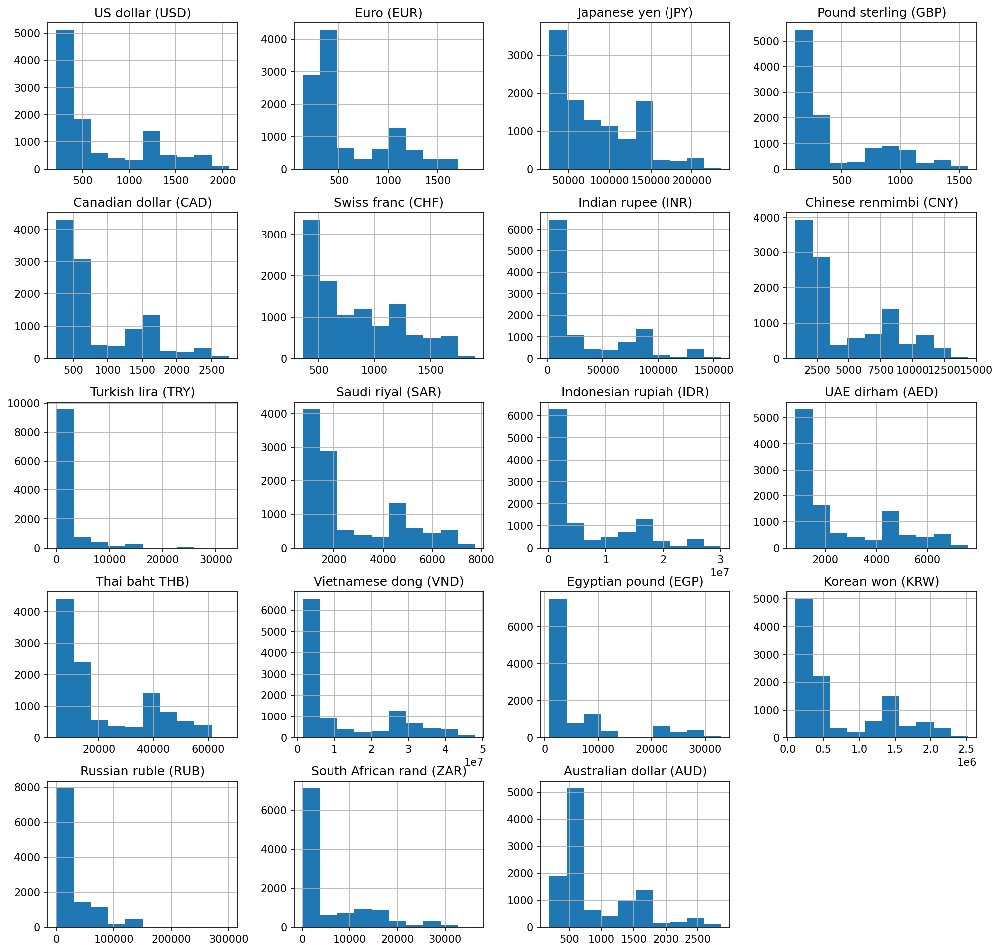

In [841]:
df_d.hist(figsize=(16,16));

Imputation using SimpleImputer library

In [842]:
my_imputer = SimpleImputer()
array_imputed_values = my_imputer.fit_transform(df_d1[['US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)', 'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)', 'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)', 'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)', 'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)', 'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)', 'Australian dollar (AUD)']])

In [843]:
array_m = np.array(array_imputed_values)
data_with_imputed_value = pd.DataFrame(array_m, columns = ['US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)', 'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)', 'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)', 'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)', 'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)', 'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)', 'Australian dollar (AUD)'], index=df_d.index)
data_with_imputed_value.head()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,226.00,137.06,84635.362384,110.70,862.75763,838.574236,34499.901552,4987.779785,2025.99905,2637.232323,6.466643e+06,2605.087062,22170.513779,1.558525e+07,7144.92534,737311.362995,37121.730451,6245.479481,891.43663
1,226.80,137.29,43164.910000,111.45,263.74000,359.620000,1792.850000,4987.779785,2025.99905,735.600000,1.381605e+05,851.290000,4454.550000,1.558525e+07,7144.92534,107470.040000,37121.730451,194.560000,193.61000
2,218.60,134.01,43717.900000,107.98,264.39000,365.870000,1802.150000,4987.779785,2025.99905,739.420000,1.388770e+05,855.710000,4477.660000,1.558525e+07,7144.92534,108027.430000,37121.730451,192.230000,192.97000
3,223.15,136.79,43674.890000,110.66,264.14000,366.380000,1811.740000,4987.779785,2025.99905,743.360000,1.396163e+05,860.260000,4501.490000,1.558525e+07,7144.92534,108602.470000,37121.730451,193.010000,194.55000
4,225.50,138.35,44582.470000,111.63,268.39000,373.720000,1843.570000,4987.779785,2025.99905,756.420000,1.420691e+05,875.380000,4580.570000,1.558525e+07,7144.92534,110510.440000,37121.730451,196.400000,197.94000


An extension to Imputation using SimpleImputer library

In [844]:
new_data = df_d1.copy()

# make new columns indicating what will be imputed
cols_with_missing = (col for col in new_data.columns 
                                 if new_data[col].isnull().any())
for col in cols_with_missing:
    new_data[col + '_was_missing'] = new_data[col].isnull()

# Imputation
my_imputer = SimpleImputer()
new_data = pd.DataFrame(my_imputer.fit_transform(new_data[['US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)', 'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)', 'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)', 'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)', 'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)', 'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)', 'Australian dollar (AUD)']]))
new_data.columns = df_d1.columns[1:]

In [845]:
new_data.head()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,226.00,137.06,84635.362384,110.70,862.75763,838.574236,34499.901552,4987.779785,2025.99905,2637.232323,6.466643e+06,2605.087062,22170.513779,1.558525e+07,7144.92534,737311.362995,37121.730451,6245.479481,891.43663
1,226.80,137.29,43164.910000,111.45,263.74000,359.620000,1792.850000,4987.779785,2025.99905,735.600000,1.381605e+05,851.290000,4454.550000,1.558525e+07,7144.92534,107470.040000,37121.730451,194.560000,193.61000
2,218.60,134.01,43717.900000,107.98,264.39000,365.870000,1802.150000,4987.779785,2025.99905,739.420000,1.388770e+05,855.710000,4477.660000,1.558525e+07,7144.92534,108027.430000,37121.730451,192.230000,192.97000
3,223.15,136.79,43674.890000,110.66,264.14000,366.380000,1811.740000,4987.779785,2025.99905,743.360000,1.396163e+05,860.260000,4501.490000,1.558525e+07,7144.92534,108602.470000,37121.730451,193.010000,194.55000
4,225.50,138.35,44582.470000,111.63,268.39000,373.720000,1843.570000,4987.779785,2025.99905,756.420000,1.420691e+05,875.380000,4580.570000,1.558525e+07,7144.92534,110510.440000,37121.730451,196.400000,197.94000


In [846]:
#!pip install git+https://github.com/blue-yonder/tsfresh

In [847]:
# Importing libraries
#from tsfresh import extract_features, extract_relevant_features, select_features
#from tsfresh.utilities.dataframe_functions import impute, make_forecasting_frame
#from tsfresh.feature_extraction import ComprehensiveFCParameters, settings

In [848]:

# Some preprocessing for time component:
#df_d.columns = ['month','Passengers']
#df_d['month'] = pd.to_datetime(df_d['month'],infer_datetime_format=True,format='%y%m')
#df_d.index = df_d.month
#df_air = df_d.drop(['month'], axis = 1)

# Use Forecasting frame from tsfresh for rolling forecast training
#df_shift, y_air = make_forecasting_frame(df_air["Passengers"], kind="Passengers", max_timeshift=12, rolling_direction=1)
#print(df_shift)

In [849]:
# Getting Comprehensive Features
#extraction_settings = ComprehensiveFCParameters()
#X = extract_features(df_shift, column_id="id", column_sort="time", column_value="value", impute_function=impute,
                     #show_warnings=False,
                     #default_fc_parameters=extraction_settings
                    # )

Seasonal Plot

In [850]:
'''
from statsmodels.tsa.seasonal import seasonal_decompose

df_copy = df_d.copy()
#analysis = df_copy[['Date','US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)', 'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)', 'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)', 'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)', 'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)', 'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)', 'Australian dollar (AUD)']]

#df_copy['Date'] = pd.to_datetime(df_copy['Date'])

#df_copy.set_index('Date', inplace=True)
decompose_result_add = seasonal_decompose(df_copy['US dollar (USD)'], model='additive', extrapolate_trend='freq')

trend_add = decompose_result_add.trend
seasonal_add = decompose_result_add.seasonal
residual_add = decompose_result_add.resid

decompose_result_add.plot()
'''

"\nfrom statsmodels.tsa.seasonal import seasonal_decompose\n\ndf_copy = df_d.copy()\n#analysis = df_copy[['Date','US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)', 'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)', 'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)', 'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)', 'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)', 'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)', 'Australian dollar (AUD)']]\n\n#df_copy['Date'] = pd.to_datetime(df_copy['Date'])\n\n#df_copy.set_index('Date', inplace=True)\ndecompose_result_add = seasonal_decompose(df_copy['US dollar (USD)'], model='additive', extrapolate_trend='freq')\n\ntrend_add = decompose_result_add.trend\nseasonal_add = decompose_result_add.seasonal\nresidual_add = decompose_result_add.resid\n\ndecompose_result_add.plot()\n"

Interactive Visualization using Plotly


In [851]:
# visualization plotly
buttons = []
i = 0
fig3 = go.Figure()
country_list = list(df_d.columns[1:])
for country in country_list:
    fig3.add_trace(
        go.Scatter(
            x = df_d['Date'],
            y = df_d[country],
            name = country, visible = (i==0)
        )
    )
    
for country in country_list:
    args = [False] * len(country_list)
    args[i] = True
    
    #create a button object for the country we are on
    button = dict(label = country,
                  method = "update",
                  args=[{"visible": args}])
    
    #add the button to our list of buttons
    buttons.append(button)
    
    #i is an iterable used to tell our "args" list which value to set to True
    i+=1


fig3.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1d",
                     step="day",
                     stepmode="backward"),
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)



fig3.update_layout(updatemenus=[dict(active=0,
                                    type="dropdown",
                                    buttons=buttons,
                                    x = 0,
                                    y = 1.1,
                                    xanchor = 'left',
                                    yanchor = 'bottom'),
                              ])
fig3.update_layout(
    autosize=False,
    width=1000,
    height=800,)


Interactive visualization using Altair

In [852]:
'''
#altlair allows to plot only for 5000 number of rows
df_sooo = df_d[:5000].copy()

input_dropdown = alt.binding_select(options=country_list)
selection = alt.selection_single(fields=['country_list'], bind=input_dropdown, name= country)
alt_plot = alt.Chart(df_sooo).mark_line().encode(
    x = df_sooo['Date'],
    y = df_sooo[country],
    tooltip='country'
).add_selection(
    selection
).transform_filter(
    selection
)
alt_plot
'''

"\n#altlair allows to plot only for 5000 number of rows\ndf_sooo = df_d[:5000].copy()\n\ninput_dropdown = alt.binding_select(options=country_list)\nselection = alt.selection_single(fields=['country_list'], bind=input_dropdown, name= country)\nalt_plot = alt.Chart(df_sooo).mark_line().encode(\n    x = df_sooo['Date'],\n    y = df_sooo[country],\n    tooltip='country'\n).add_selection(\n    selection\n).transform_filter(\n    selection\n)\nalt_plot\n"

Normalization

In [853]:
normalised_df = df_d.copy()
scaler = preprocessing.MinMaxScaler()
names = normalised_df[['US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)', 'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)', 'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)', 'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)', 'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)', 'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)', 'Australian dollar (AUD)']]
d = scaler.fit_transform(names)
scaled_df = pd.DataFrame(d)
scaled_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0.004945,0.001856,0.078286,0.001857,0.002772,0.000000,0.000070,0.001932,0.0,0.002482,0.000101,0.003806,0.001262,0.006589,0.004098,0.000269,0.0,0.000208,0.001425
1,0.005378,0.001988,0.078286,0.002369,0.002772,0.000000,0.000070,0.001932,0.0,0.002482,0.000101,0.003806,0.001262,0.006589,0.004098,0.000269,0.0,0.000208,0.001425
2,0.000946,0.000103,0.080933,0.000000,0.003033,0.004073,0.000130,0.001932,0.0,0.003025,0.000125,0.004460,0.001628,0.006589,0.004098,0.000500,0.0,0.000143,0.001186
3,0.003405,0.001700,0.080727,0.001830,0.002933,0.004405,0.000192,0.001932,0.0,0.003585,0.000150,0.005132,0.002004,0.006589,0.004098,0.000738,0.0,0.000165,0.001777
4,0.004675,0.002597,0.085072,0.002492,0.004638,0.009188,0.000397,0.001932,0.0,0.005442,0.000231,0.007366,0.003255,0.006589,0.004098,0.001528,0.0,0.000259,0.003045


In [854]:
normalised_df['US dollar (USD)'] = scaled_df[0]
normalised_df['Euro (EUR)'] = scaled_df[1]
normalised_df['Japanese yen (JPY)'] = scaled_df[2]
normalised_df['Pound sterling (GBP)'] = scaled_df[3]
normalised_df['Canadian dollar (CAD)'] = scaled_df[4]
normalised_df['Swiss franc (CHF)'] = scaled_df[5]
normalised_df['Indian rupee (INR)'] = scaled_df[6]
normalised_df['Chinese renmimbi (CNY)'] = scaled_df[7]
normalised_df['Turkish lira (TRY)'] = scaled_df[8]
normalised_df['Saudi riyal (SAR)'] = scaled_df[9]
normalised_df['Indonesian rupiah (IDR)'] = scaled_df[10]
normalised_df['UAE dirham (AED)'] = scaled_df[11]
normalised_df['Thai baht THB)'] = scaled_df[12]
normalised_df['Vietnamese dong (VND)'] = scaled_df[13]
normalised_df['Egyptian pound (EGP)'] = scaled_df[14]
normalised_df['Korean won (KRW)'] = scaled_df[15]
normalised_df['Russian ruble (RUB)'] = scaled_df[16]
normalised_df['South African rand (ZAR)'] = scaled_df[17]
normalised_df['Australian dollar (AUD)'] = scaled_df[18]
normalised_df.head()

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-01,0.004945,0.001856,0.078286,0.001857,0.002772,0.000000,0.000070,0.001932,0.0,0.002482,0.000101,0.003806,0.001262,0.006589,0.004098,0.000269,0.0,0.000208,0.001425
1,1979-01-02,0.005378,0.001988,0.078286,0.002369,0.002772,0.000000,0.000070,0.001932,0.0,0.002482,0.000101,0.003806,0.001262,0.006589,0.004098,0.000269,0.0,0.000208,0.001425
2,1979-01-03,0.000946,0.000103,0.080933,0.000000,0.003033,0.004073,0.000130,0.001932,0.0,0.003025,0.000125,0.004460,0.001628,0.006589,0.004098,0.000500,0.0,0.000143,0.001186
3,1979-01-04,0.003405,0.001700,0.080727,0.001830,0.002933,0.004405,0.000192,0.001932,0.0,0.003585,0.000150,0.005132,0.002004,0.006589,0.004098,0.000738,0.0,0.000165,0.001777
4,1979-01-05,0.004675,0.002597,0.085072,0.002492,0.004638,0.009188,0.000397,0.001932,0.0,0.005442,0.000231,0.007366,0.003255,0.006589,0.004098,0.001528,0.0,0.000259,0.003045


In [855]:
df_d_copy = df_d.copy()
df_d['Date'] = pd.to_datetime(df_d['Date'])

# Make Column Date as index
df_d.set_index('Date', inplace=True)

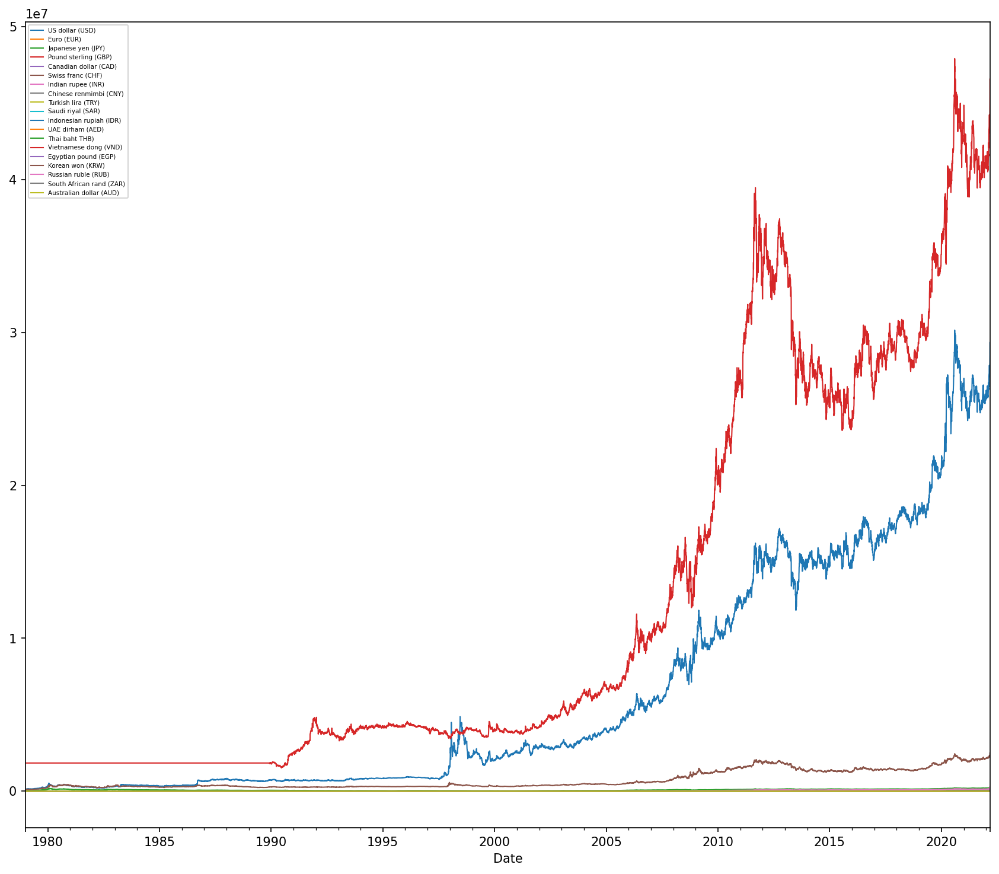

In [856]:
ax = df_d.plot(linewidth=1, fontsize=10);

# Additional customizations
ax.set_xlabel('Date');
ax.legend(fontsize=5);

# Monthly Data-set

In [857]:
df_m = pd.read_csv('Monthly_Gold_Price_on_World.csv')
df_m.head()

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,1979-01-31,233.7,144.84,45160.33,117.44,267.10,379.32,1840.82,0.0,0.0,745.20,139739.28,856.14,4511.27,0.0,0.0,108235.82,0.0,194.53,197.17
1,1979-02-28,251.3,154.64,50209.08,124.19,295.50,413.61,2011.68,0.0,0.0,827.84,154683.13,946.62,4985.70,0.0,0.0,119929.27,0.0,209.36,219.63
2,1979-03-30,240.1,148.04,50274.29,116.22,278.16,406.20,1940.16,0.0,0.0,796.73,148844.15,910.39,4812.88,0.0,0.0,116123.63,0.0,202.37,214.55
3,1979-04-30,245.3,152.76,54144.57,118.82,278.53,420.01,2013.10,0.0,0.0,819.39,152453.63,930.21,4890.99,0.0,0.0,117423.25,0.0,206.91,221.12
4,1979-05-31,274.6,172.00,61057.09,132.69,321.62,478.01,2253.41,0.0,0.0,933.26,171656.12,1048.41,5560.75,0.0,0.0,133889.58,0.0,233.65,250.72


In [858]:
df_m.shape

(518, 20)

In [859]:
df_m.isnull().values.any()

False

In [860]:
df_m.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 518 entries, 0 to 517
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      518 non-null    object 
 1   US dollar (USD)           518 non-null    float64
 2   Euro (EUR)                518 non-null    float64
 3   Japanese yen (JPY)        518 non-null    float64
 4   Pound sterling (GBP)      518 non-null    float64
 5   Canadian dollar (CAD)     518 non-null    float64
 6   Swiss franc (CHF)         518 non-null    float64
 7   Indian rupee (INR)        518 non-null    float64
 8   Chinese renmimbi (CNY)    518 non-null    float64
 9   Turkish lira (TRY)        518 non-null    float64
 10  Saudi riyal (SAR)         518 non-null    float64
 11  Indonesian rupiah (IDR)   518 non-null    float64
 12  UAE dirham (AED)          518 non-null    float64
 13  Thai baht THB)            518 non-null    float64
 14  Vietnamese

In [861]:
df_m.describe()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
count,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,518.000000,5.180000e+02,518.000000,518.000000,5.180000e+02,518.000000,5.180000e+02,518.000000,518.000000,518.000000
mean,708.716506,586.517587,84597.556699,462.127645,862.979170,837.434479,34495.285039,4294.515772,1840.496699,2637.220270,6.472446e+06,2604.392529,22176.631351,1.165174e+07,5498.901622,7.369229e+05,25144.381409,6245.630946,891.821564
std,487.988573,396.384753,46334.630040,359.358501,568.311016,375.754053,37696.465433,3576.785296,3723.526017,1842.280812,7.621822e+06,1791.993602,16120.807971,1.320929e+07,8025.900985,5.987447e+05,36779.374688,7726.876427,600.236501
min,233.700000,144.840000,27937.540000,116.220000,267.100000,379.320000,1840.820000,0.000000,0.000000,745.200000,1.397393e+05,856.140000,4511.270000,0.000000e+00,0.000000,1.082358e+05,0.000000,194.530000,197.170000
25%,354.787500,307.372500,43165.352500,219.212500,456.650000,502.072500,6295.650000,1725.630000,0.880000,1317.202500,7.001355e+05,1301.760000,9615.020000,0.000000e+00,939.622500,3.021288e+05,0.000000,974.430000,475.510000
50%,416.125000,369.405000,72124.700000,258.305000,534.765000,712.815000,13216.545000,3052.970000,178.790000,1524.325000,2.615656e+06,1534.805000,12244.665000,4.265233e+06,1309.005000,3.790226e+05,7744.645000,1942.520000,555.110000
75%,1180.000000,960.445000,126658.385000,759.710000,1356.237500,1138.620000,67744.000000,7478.690000,2324.462500,4425.232500,1.284870e+07,4334.095000,39254.015000,2.538367e+07,8322.012500,1.319516e+06,41909.315000,10182.995000,1389.097500
max,1964.900000,1700.370000,219966.990000,1497.070000,2631.980000,1787.470000,146999.070000,13714.020000,26469.850000,7369.160000,2.868754e+07,7217.370000,62404.350000,4.553950e+07,31379.450000,2.340982e+06,204712.060000,33459.780000,2739.870000


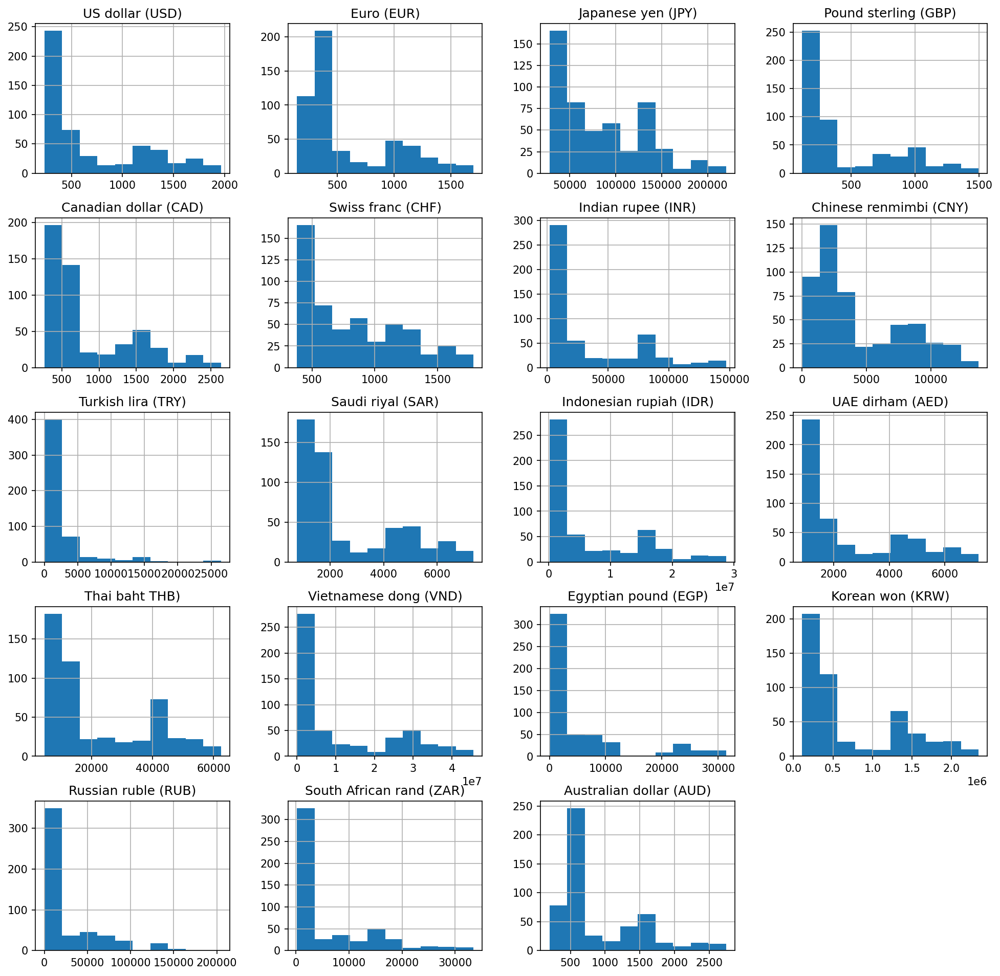

In [862]:
df_m.hist(figsize=(16,16));

# Quarterly Data-set

In [863]:
df_q = pd.read_csv('Quarterly_Gold_Price_on_World.csv')
df_q.head()

,Date,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
0,Q1 1979,240.10,148.04,50274.29,116.22,278.16,406.20,1940.16,0.0,0.0,796.73,148844.15,910.39,4812.88,0.0,0.0,116123.63,0.0,202.37,214.55
1,Q2 1979,277.50,169.03,60161.40,127.29,322.55,457.71,2190.55,0.0,0.0,923.02,166854.38,1049.81,5477.29,0.0,0.0,133065.59,0.0,232.34,245.46
2,Q3 1979,397.25,233.23,89088.49,180.36,460.72,616.45,3190.26,0.0,0.0,1306.81,242994.79,1474.44,7894.94,0.0,0.0,191720.57,0.0,327.15,351.67
3,Q4 1979,512.00,299.12,125630.27,230.63,611.81,835.57,4189.64,0.0,0.0,1749.03,324101.29,2055.87,10645.23,0.0,0.0,253615.89,0.0,434.07,474.31
4,Q1 1980,494.50,321.56,125800.01,228.51,599.47,931.87,4155.35,0.0,0.0,1683.53,316964.84,1890.49,10312.81,0.0,0.0,294925.42,0.0,407.51,465.18


In [864]:
df_q.shape

(172, 20)

In [865]:
df_q.isnull().values.any()

False

In [866]:
df_q.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172 entries, 0 to 171
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      172 non-null    object 
 1   US dollar (USD)           172 non-null    float64
 2   Euro (EUR)                172 non-null    float64
 3   Japanese yen (JPY)        172 non-null    float64
 4   Pound sterling (GBP)      172 non-null    float64
 5   Canadian dollar (CAD)     172 non-null    float64
 6   Swiss franc (CHF)         172 non-null    float64
 7   Indian rupee (INR)        172 non-null    float64
 8   Chinese renmimbi (CNY)    172 non-null    float64
 9   Turkish lira (TRY)        172 non-null    float64
 10  Saudi riyal (SAR)         172 non-null    float64
 11  Indonesian rupiah (IDR)   172 non-null    float64
 12  UAE dirham (AED)          172 non-null    float64
 13  Thai baht THB)            172 non-null    float64
 14  Vietnamese

In [867]:
df_q.describe()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
count,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,172.000000
mean,703.998547,582.178663,84083.890000,459.532733,857.942151,832.096337,34126.788953,4265.017500,1783.732558,2619.488721,6.428277e+06,2586.601570,22049.732558,1.154812e+07,5434.208605,7.316697e+05,24667.083023,6170.235930,886.467616
std,479.464923,390.130886,45495.886243,354.905596,559.511964,369.677355,37093.180293,3533.574141,3540.612449,1810.416197,7.556214e+06,1761.122954,15907.022724,1.303406e+07,7918.603767,5.886163e+05,35677.649264,7605.617941,589.973027
min,240.100000,148.040000,28384.860000,116.220000,278.160000,395.290000,1940.160000,0.000000,0.000000,796.730000,1.488441e+05,910.390000,4812.880000,0.000000e+00,0.000000,1.161236e+05,0.000000,202.370000,214.550000
25%,351.400000,303.685000,43166.877500,219.472500,461.335000,501.555000,6164.120000,1720.602500,0.860000,1313.020000,6.991754e+05,1289.257500,9629.127500,1.178796e+06,947.155000,3.021713e+05,0.000000,976.685000,476.782500
50%,418.625000,368.855000,70603.190000,258.680000,537.740000,706.595000,13280.605000,2976.130000,180.315000,1540.100000,2.669946e+06,1538.490000,12244.665000,4.266262e+06,1316.525000,3.864125e+05,7875.630000,1964.845000,560.210000
75%,1175.000000,958.140000,125059.752500,746.032500,1345.467500,1131.125000,64954.037500,7375.280000,2241.175000,4406.557500,1.256346e+07,4315.697500,38829.977500,2.530950e+07,8316.652500,1.308873e+06,40189.340000,9846.582500,1375.915000
max,1887.600000,1609.090000,207952.670000,1459.550000,2520.430000,1733.590000,139215.470000,12850.920000,23981.240000,7081.520000,2.807707e+07,6933.440000,60324.420000,4.374211e+07,29737.540000,2.206729e+06,146425.800000,31473.480000,2632.580000


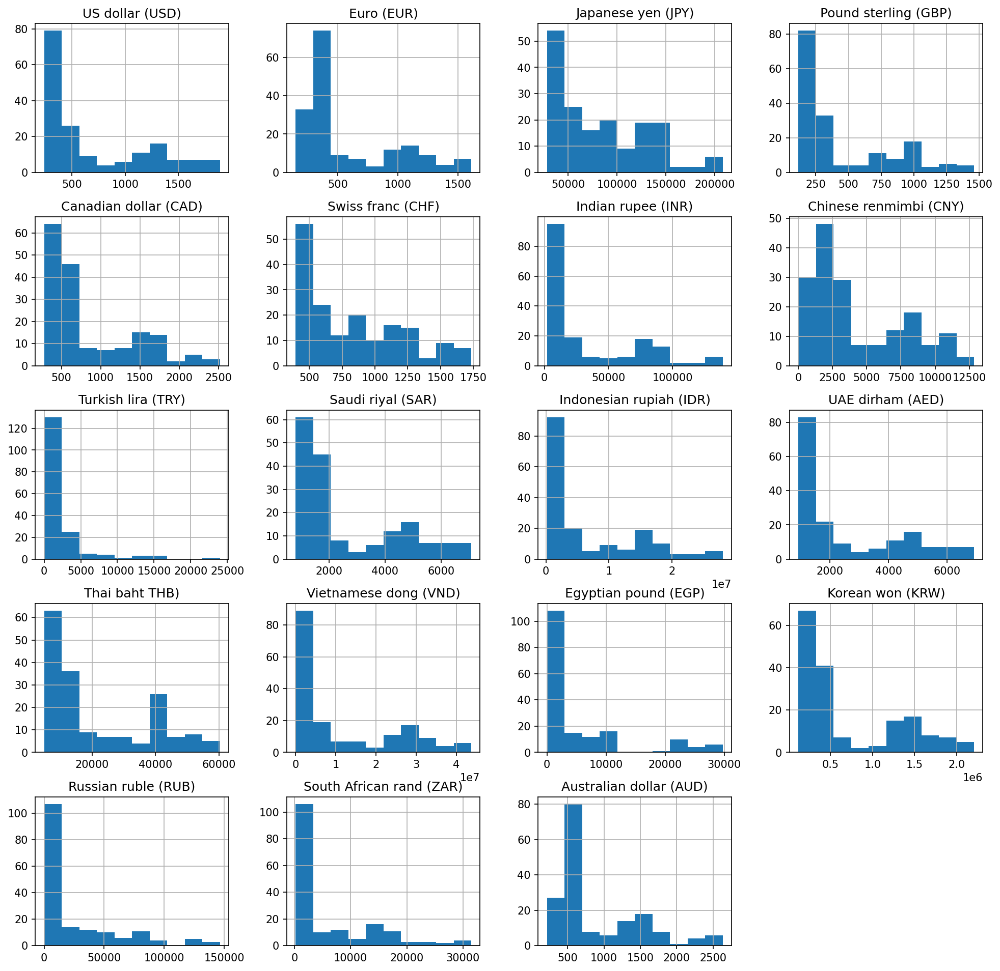

In [868]:
df_q.hist(figsize=(16,16));

# Model

**ARIMA model**

In [869]:
df_arima = df_d.copy()

In [870]:
# testing on sample 
result = adfuller(df_arima['US dollar (USD)'])
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: 0.652138
p-value: 0.988833


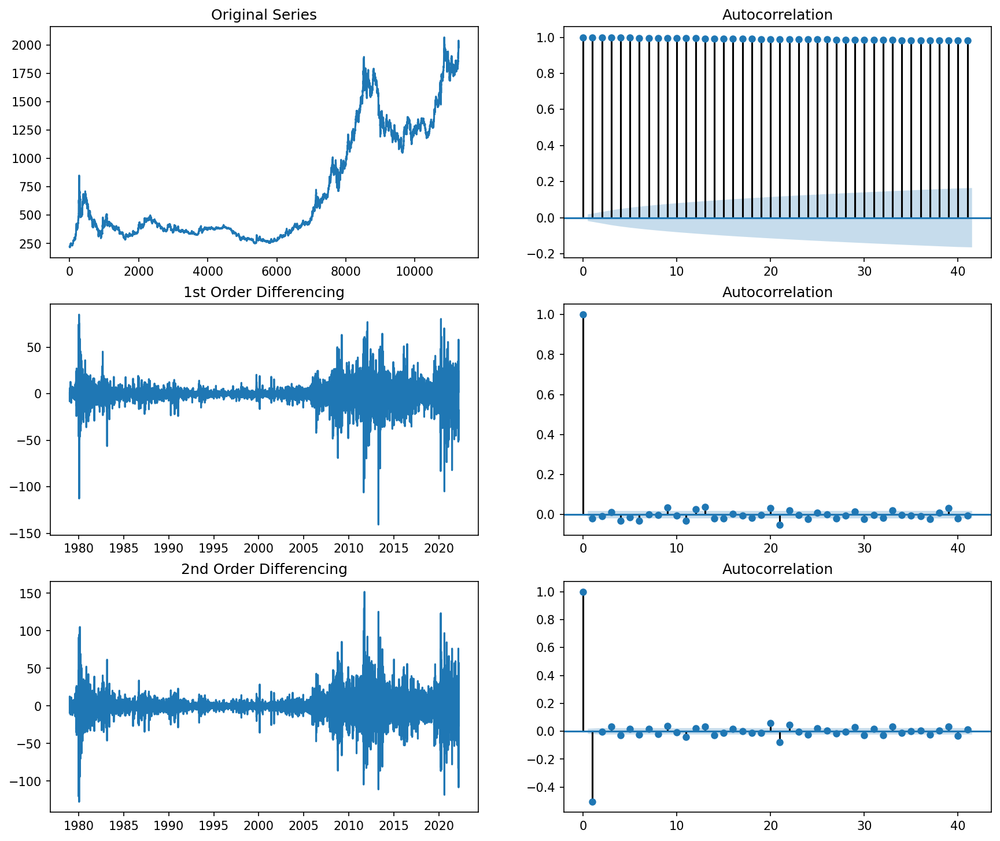

In [871]:
# Original Series
fig, axes = plt.subplots(3, 2, sharex=False)
fig.set_size_inches(14,12)

axes[0, 0].plot(df_arima['US dollar (USD)'].values); axes[0, 0].set_title('Original Series')
plot_acf(df_arima['US dollar (USD)'].values, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df_arima['US dollar (USD)'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(df_arima['US dollar (USD)'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df_arima['US dollar (USD)'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df_arima['US dollar (USD)'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

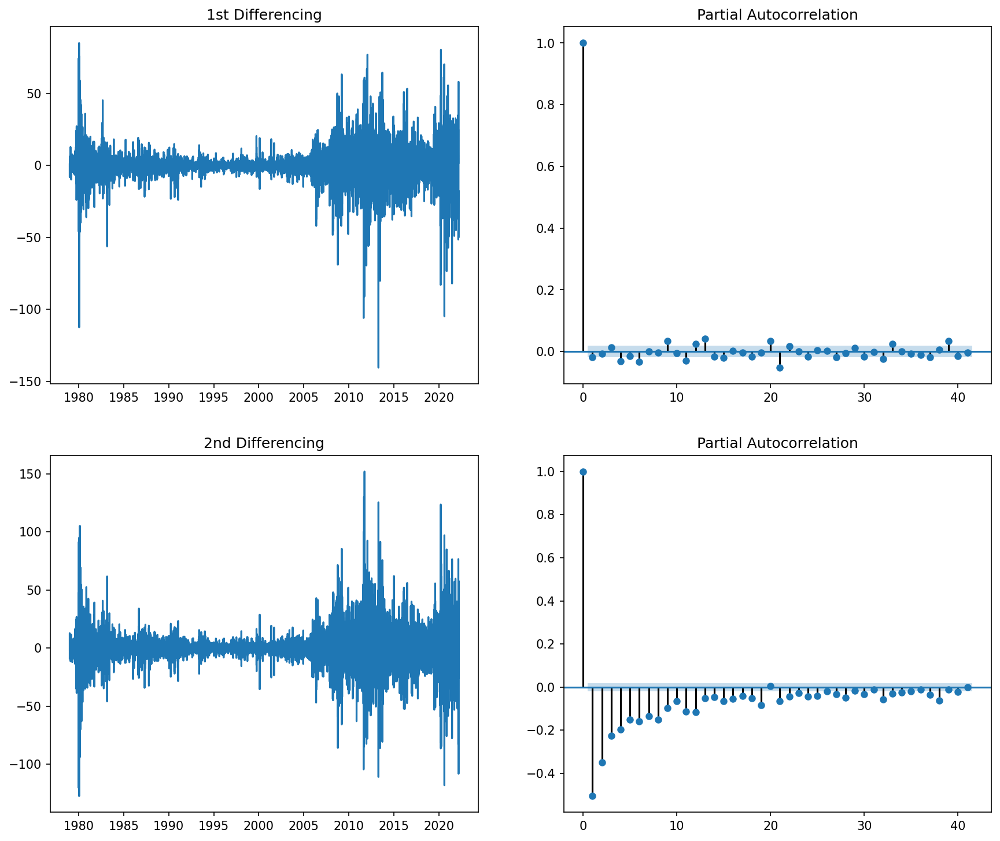

In [872]:
# PACF plot of 1st differenced series
plt.rcParams.update({'figure.figsize':(14,12), 'figure.dpi':150})

## first order differencing
fig, axes = plt.subplots(2, 2, sharex=False)
axes[0, 0].plot(df_arima['US dollar (USD)'].diff()); axes[0, 0].set_title('1st Differencing')
plot_pacf(df_arima['US dollar (USD)'].diff().dropna(), ax=axes[0, 1])

## second order differencing
axes[1, 0].plot(df_arima['US dollar (USD)'].diff().diff()); axes[1, 0].set_title('2nd Differencing')
plot_pacf(df_arima['US dollar (USD)'].diff().diff().dropna(), ax=axes[1, 1])

plt.show()

100 most recent days validation

In [873]:
total = len(df_arima['US dollar (USD)'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size = total - 100

X_train_arima = df_arima['US dollar (USD)'].iloc[0:train_size]
X_test_arima = df_arima['US dollar (USD)'].iloc[train_size:]

In [874]:
# model training on whole dataset
# 1,1,1 ARIMA Model (p,d,q)
model_arima = ARIMA(X_train_arima, order=(1,1,1))
model_fit_arima = model_arima.fit()
model_fit_arima.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:      D.US dollar (USD)   No. Observations:                11169
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -41131.970
Method:                       css-mle   S.D. of innovations              9.619
Date:                Fri, 08 Apr 2022   AIC                          82271.940
Time:                        19:25:50   BIC                          82301.224
Sample:                    01-02-1979   HQIC                         82281.798
                         - 10-22-2021                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                       0.1412      0.077      1.824      0.068      -0.011       0.293
ar.L1.D.US dollar (USD)     0.9387      0.041     22.628      0.000       0.857       1.020
ma.L1.D.US dollar (USD)    -0.9479      0.038    -24.712      0.000      -1.023      -0.873
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0653           +0.0000j            1.0653            0.0000
MA.1            1.0550           +0.0000j            1.0550            0.0000
-----------------------------------------------------------------------------
"""

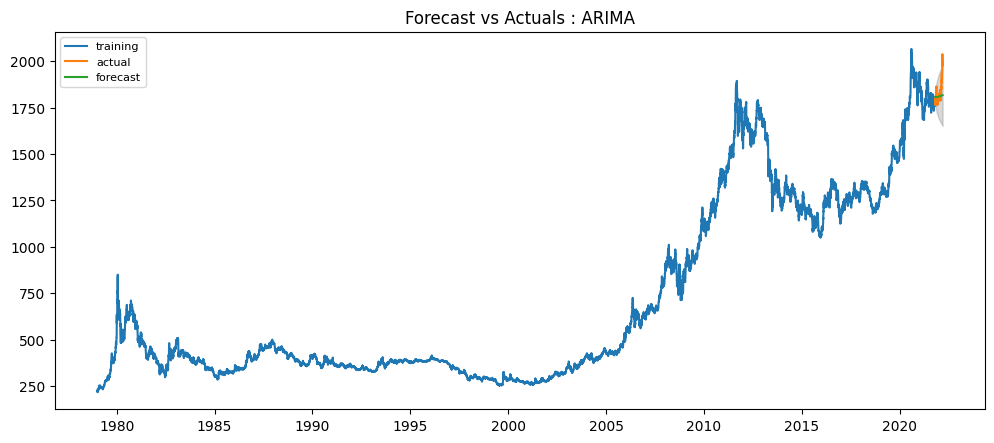

In [875]:
# Forecast
fc_arima, se, conf_arima = model_fit_arima.forecast(X_test_arima.shape[0], alpha=0.05)  # 95% conf_arima

# Make as pandas series
fc_series_arima = pd.Series(fc_arima, index=X_test_arima.index)
lower_series = pd.Series(conf_arima[:, 0], index=X_test_arima.index)
upper_series = pd.Series(conf_arima[:, 1], index=X_test_arima.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(X_train_arima, label='training')
plt.plot(X_test_arima, label='actual')
plt.plot(fc_series_arima, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.15)
plt.title('Forecast vs Actuals : ARIMA')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [876]:
'''
# Create Training and Test

total = len(df_arima['US dollar (USD)'])

# Split in 80:20 ratio
training_size = int(total * 0.8)


train = df_arima['US dollar (USD)'][:training_size]
test = df_arima['US dollar (USD)'][training_size:]

print(train.shape, test.shape)
'''

"\n# Create Training and Test\n\ntotal = len(df_arima['US dollar (USD)'])\n\n# Split in 80:20 ratio\ntraining_size = int(total * 0.8)\n\n\ntrain = df_arima['US dollar (USD)'][:training_size]\ntest = df_arima['US dollar (USD)'][training_size:]\n\nprint(train.shape, test.shape)\n"

In [877]:
'''
# model training on 80:20 ratio of dataset
# Build Model
model = ARIMA(train, order=(1, 1, 0))  
fitted = model.fit() 
''' 

'\n# model training on 80:20 ratio of dataset\n# Build Model\nmodel = ARIMA(train, order=(1, 1, 0))  \nfitted = model.fit() \n'

In [878]:
#fitted.summary()

In [879]:
'''
# Forecast
fc, se, conf = fitted.forecast(test.shape[0], alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()
'''

"\n# Forecast\nfc, se, conf = fitted.forecast(test.shape[0], alpha=0.05)  # 95% conf\n\n# Make as pandas series\nfc_series = pd.Series(fc, index=test.index)\nlower_series = pd.Series(conf[:, 0], index=test.index)\nupper_series = pd.Series(conf[:, 1], index=test.index)\n\n# Plot\nplt.figure(figsize=(12,5), dpi=100)\nplt.plot(train, label='training')\nplt.plot(test, label='actual')\nplt.plot(fc_series, label='forecast')\nplt.fill_between(lower_series.index, lower_series, upper_series, \n                 color='k', alpha=.15)\nplt.title('Forecast vs Actuals')\nplt.legend(loc='upper left', fontsize=8)\nplt.show()\n"

Report the MAE, MAPE and RMSE accuracy

In [880]:
mae = metrics.mean_absolute_error(fc_series_arima.values, X_test_arima)
mape = metrics.mean_absolute_percentage_error(fc_series_arima.values, X_test_arima)
mse = metrics.mean_squared_error(fc_series_arima.values, X_test_arima)
rmse = np.sqrt(mse)

In [881]:
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

MAE: 37.98408784895271
MAPE: 0.020944303314716074
RMSE: 57.82321516225021


**Sarima Model**

In [882]:
df_sarima = df_d.copy()

100 most recent days validation

In [883]:
total = len(df_sarima['US dollar (USD)'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size = total - 100

X_train_sarima = df_sarima['US dollar (USD)'].iloc[0:train_size]
X_test_sarima = df_sarima['US dollar (USD)'].iloc[train_size:]

In [884]:
model_sarima=sm.tsa.statespace.SARIMAX(X_train_sarima, order=(1,1,0), seasonal_order=(1,1,0,7)) #(p,d,q,seasonal_window)
model_fit_sarima=model_sarima.fit()
model_fit_sarima.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                
=========================================================================================
Dep. Variable:                   US dollar (USD)   No. Observations:                11170
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 7)   Log Likelihood              -43445.856
Date:                           Fri, 08 Apr 2022   AIC                          86897.711
Time:                                   19:25:55   BIC                          86919.672
Sample:                               01-01-1979   HQIC                         86905.104
                                    - 10-22-2021                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0144      0.004     -3.300      0.001      -0.023      -0.006
ar.S.L7       -0.4882      0.003   -140.626      0.000      -0.495      -0.481
sigma2       140.6890      0.633    222.171      0.000     139.448     141.930
===================================================================================
Ljung-Box (Q):                     1739.13   Jarque-Bera (JB):            116019.18
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               3.98   Skew:                            -0.36
Prob(H) (two-sided):                  0.00   Kurtosis:                        18.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

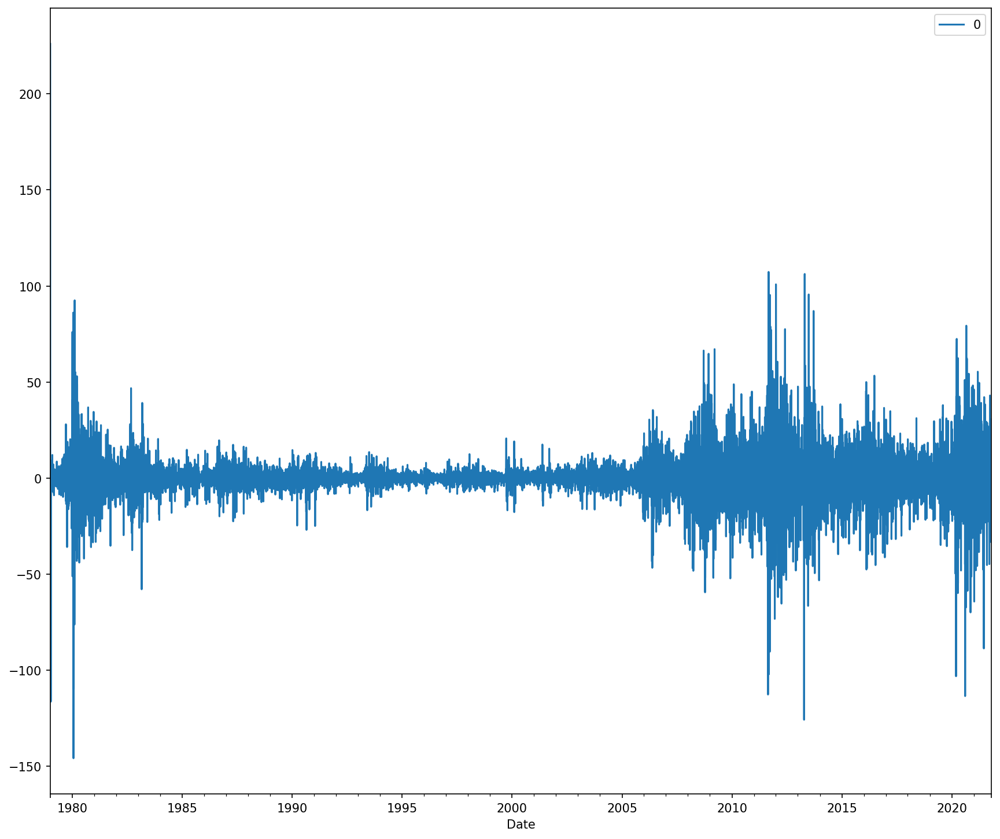

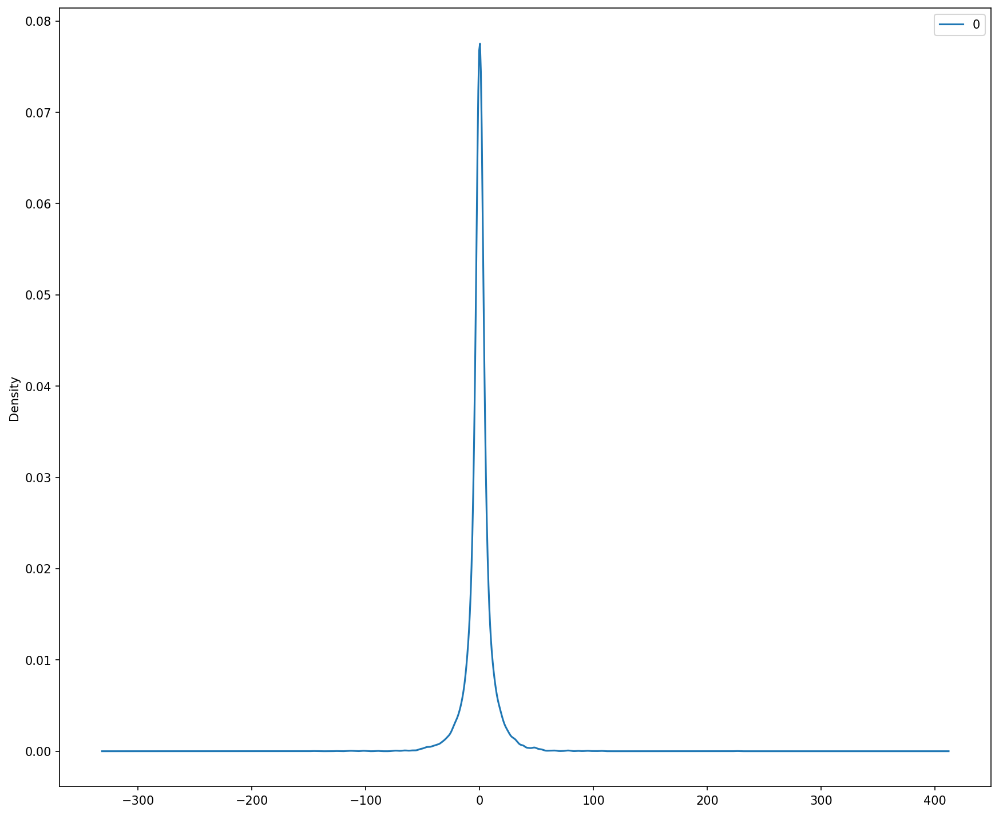

                  0
count  11170.000000
mean       0.013758
std       12.099469
min     -145.753042
25%       -3.380769
50%        0.050298
75%        3.471200
max      226.000000


In [885]:
residuals = pd.DataFrame(model_fit_sarima.resid)
residuals.plot()
plt.show()
# density plot of residuals
residuals.plot(kind='kde')
plt.show()
# summary stats of residuals
print(residuals.describe())

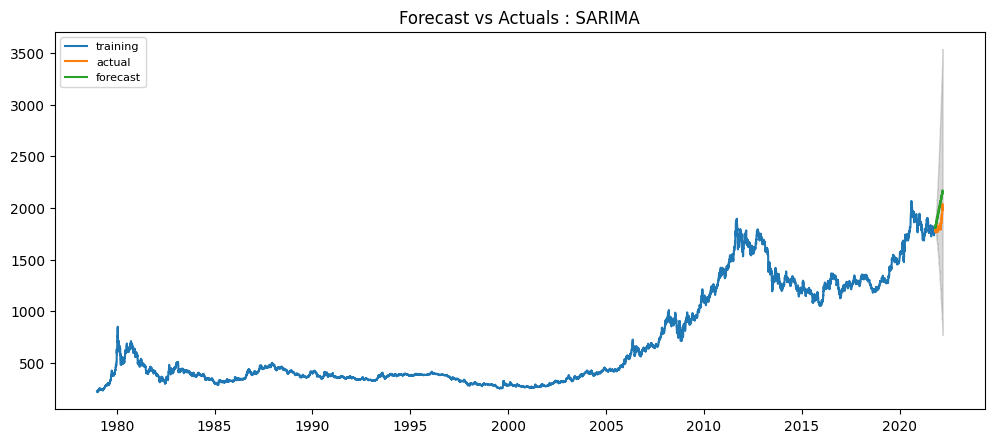

In [886]:
# Testing for X_test
test_size_sarima = len(X_test_sarima)

# Forecast
fc_sarima = model_fit_sarima.get_forecast(test_size_sarima, alpha=0.05)  # 95% conf

conf_sarima = fc_sarima.conf_int()

lower_series = conf_sarima.iloc[:, 0]
upper_series = conf_sarima.iloc[:, 1]

#Make as pandas series
fc_series_sarima = fc_sarima.predicted_mean

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(X_train_sarima, label='training')
plt.plot(X_test_sarima, label='actual')
plt.plot(fc_series_sarima, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.15)
plt.title('Forecast vs Actuals : SARIMA')
plt.legend(loc='upper left', fontsize=8)
plt.show()

Report the MAE, MAPE and RMSE accuracy

In [887]:
mae = metrics.mean_absolute_error(fc_series_sarima.values, X_test_sarima)
mape = metrics.mean_absolute_percentage_error(fc_series_sarima.values, X_test_sarima)
mse = metrics.mean_squared_error(fc_series_sarima.values, X_test_sarima)
rmse = np.sqrt(mse)

In [888]:
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

MAE: 148.00123822901458
MAPE: 0.07318217955883913
RMSE: 167.86507401626275


In [889]:
df_d

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
Date,,,,,,,,,,,,,,,,,,,
1979-01-01,226.00,137.06,43164.91,110.70,263.74,359.62,1792.85,835.80,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1979-01-02,226.80,137.29,43164.91,111.45,263.74,359.62,1792.85,835.80,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1979-01-03,218.60,134.01,43717.90,107.98,264.39,365.87,1802.15,835.80,0.08,739.42,138877.01,855.71,4477.66,1842229.16,995.19,108027.43,132.71,192.23,192.97
1979-01-04,223.15,136.79,43674.89,110.66,264.14,366.38,1811.74,835.80,0.08,743.36,139616.26,860.26,4501.49,1842229.16,995.19,108602.47,132.71,193.01,194.55
1979-01-05,225.50,138.35,44582.47,111.63,268.39,373.72,1843.57,835.80,0.08,756.42,142069.10,875.38,4580.57,1842229.16,995.19,110510.44,132.71,196.40,197.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-07,1980.95,1821.48,228571.91,1508.09,2529.77,1833.86,152468.77,12516.24,28505.87,7432.52,28540536.42,7276.13,65311.92,45264706.38,31180.15,2430724.64,300113.92,30313.49,2703.08
2022-03-08,2039.05,1874.56,235714.19,1555.28,2623.75,1894.28,156815.69,12874.97,29729.35,7650.31,29357223.08,7489.63,67625.09,46587195.99,32033.48,2522508.82,267115.56,31207.66,2806.87
2022-03-09,1988.90,1800.64,230344.44,1511.72,2548.87,1843.21,152282.61,12562.39,29152.30,7461.76,28537730.25,7305.33,65772.92,45421501.52,31245.62,2460468.07,269495.94,29885.71,2718.00


**Linear Regressor**

In [890]:
df_regressor = df_d.copy()

In [891]:
NO_OF_LAG_DAYS = 7

In [892]:
def create_lag_feature(dff, no_of_days):
    
    for day in range(1, no_of_days+1):
        dff[f"lag_{day}"] = dff['US dollar (USD)'].shift(day)
        
    return dff

In [893]:
df_features = create_lag_feature(df_regressor, NO_OF_LAG_DAYS)

In [894]:
lag_features =  [ col for col in df_features.columns if "lag" in col]
print(lag_features)

['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7']


In [895]:
df_lag_features = df_features[lag_features + ['US dollar (USD)']].dropna()
df_lag_features.columns

Index(['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7',
       'US dollar (USD)'],
      dtype='object')

In [896]:
df_lag_features.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,US dollar (USD)
Date,,,,,,,,
1979-01-10,224.00,223.10,225.50,223.15,218.60,226.80,226.00,220.70
1979-01-11,220.70,224.00,223.10,225.50,223.15,218.60,226.80,220.65
1979-01-12,220.65,220.70,224.00,223.10,225.50,223.15,218.60,217.60
1979-01-15,217.60,220.65,220.70,224.00,223.10,225.50,223.15,216.85
1979-01-16,216.85,217.60,220.65,220.70,224.00,223.10,225.50,220.65


100 most recent days validation

In [897]:
total = len(df_regressor['US dollar (USD)'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size = total - 100

X_train_regressor = df_lag_features[:train_size]
X_test_regressor = df_lag_features[train_size:]

print(X_train_regressor.shape, X_test_regressor.shape)

(11170, 8) (93, 8)


In [898]:
'''
NUM_PREDICTION = 500
train_df = df_lag_features[:-NUM_PREDICTION]
test_df = df_lag_features[-NUM_PREDICTION:]

print(train_df.shape, test_df.shape)
'''

'\nNUM_PREDICTION = 500\ntrain_df = df_lag_features[:-NUM_PREDICTION]\ntest_df = df_lag_features[-NUM_PREDICTION:]\n\nprint(train_df.shape, test_df.shape)\n'

In [899]:
model_regressor = mlp = MLPRegressor(solver='lbfgs', hidden_layer_sizes=12,
                           max_iter=1000, random_state=5,
                           activation="relu") 

In [900]:
X_train_df_regressor = X_train_regressor[lag_features]
X_test_df_regressor = X_test_regressor[lag_features]

In [901]:
X_train_df_regressor

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7
Date,,,,,,,
1979-01-10,224.00,223.10,225.50,223.15,218.60,226.80,226.00
1979-01-11,220.70,224.00,223.10,225.50,223.15,218.60,226.80
1979-01-12,220.65,220.70,224.00,223.10,225.50,223.15,218.60
1979-01-15,217.60,220.65,220.70,224.00,223.10,225.50,223.15
1979-01-16,216.85,217.60,220.65,220.70,224.00,223.10,225.50
...,...,...,...,...,...,...,...
2021-10-27,1785.55,1805.25,1808.25,1779.30,1778.00,1779.55,1767.85
2021-10-28,1795.25,1785.55,1805.25,1808.25,1779.30,1778.00,1779.55
2021-10-29,1803.50,1795.25,1785.55,1805.25,1808.25,1779.30,1778.00


In [902]:
model_regressor.fit(X_train_df_regressor, X_train_regressor['US dollar (USD)'])

MLPRegressor(hidden_layer_sizes=12, max_iter=1000, random_state=5,
             solver='lbfgs')

In [903]:
predicted_price = model_regressor.predict(X_test_df_regressor)
X_test_regressor[f"{'US dollar (USD)'} predicted price"] = predicted_price

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [904]:
X_test_regressor[['US dollar (USD)', f"{'US dollar (USD)'} predicted price"]]

,US dollar (USD),US dollar (USD) predicted price
Date,,
2021-11-03,1763.45,1790.334273
2021-11-04,1796.15,1764.155401
2021-11-05,1801.85,1795.473552
2021-11-08,1822.35,1802.084119
2021-11-09,1827.30,1821.868384
...,...,...
2022-03-07,1980.95,1945.948585
2022-03-08,2039.05,1978.854060
2022-03-09,1988.90,2037.277566


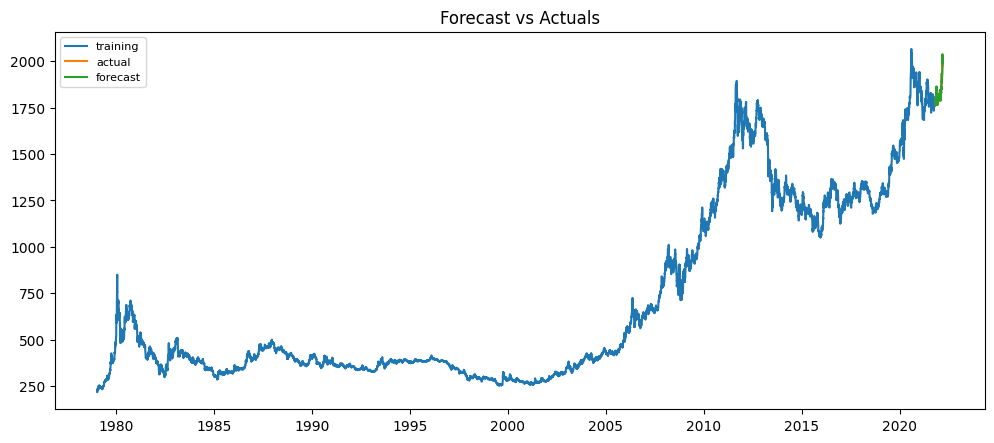

In [905]:
# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(X_train_regressor['US dollar (USD)'], label='training')
plt.plot(X_test_regressor['US dollar (USD)'], label='actual')
plt.plot(X_test_regressor[f"{'US dollar (USD)'} predicted price"], label='forecast')
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

Report the MAE, MAPE and RMSE accuracy

In [906]:
mae = metrics.mean_absolute_error(X_test_regressor['US dollar (USD)'], X_test_regressor['US dollar (USD) predicted price'])
mape = metrics.mean_absolute_percentage_error(X_test_regressor['US dollar (USD)'], X_test_regressor['US dollar (USD) predicted price'])
mse = metrics.mean_squared_error(X_test_regressor['US dollar (USD)'], X_test_regressor['US dollar (USD) predicted price'])
rmse = np.sqrt(mse)

In [907]:
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

MAE: 12.652462798822821
MAPE: 0.006834089147184717
RMSE: 17.782349123314862


In [908]:
df_d

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
Date,,,,,,,,,,,,,,,,,,,
1979-01-01,226.00,137.06,43164.91,110.70,263.74,359.62,1792.85,835.80,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1979-01-02,226.80,137.29,43164.91,111.45,263.74,359.62,1792.85,835.80,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1979-01-03,218.60,134.01,43717.90,107.98,264.39,365.87,1802.15,835.80,0.08,739.42,138877.01,855.71,4477.66,1842229.16,995.19,108027.43,132.71,192.23,192.97
1979-01-04,223.15,136.79,43674.89,110.66,264.14,366.38,1811.74,835.80,0.08,743.36,139616.26,860.26,4501.49,1842229.16,995.19,108602.47,132.71,193.01,194.55
1979-01-05,225.50,138.35,44582.47,111.63,268.39,373.72,1843.57,835.80,0.08,756.42,142069.10,875.38,4580.57,1842229.16,995.19,110510.44,132.71,196.40,197.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-07,1980.95,1821.48,228571.91,1508.09,2529.77,1833.86,152468.77,12516.24,28505.87,7432.52,28540536.42,7276.13,65311.92,45264706.38,31180.15,2430724.64,300113.92,30313.49,2703.08
2022-03-08,2039.05,1874.56,235714.19,1555.28,2623.75,1894.28,156815.69,12874.97,29729.35,7650.31,29357223.08,7489.63,67625.09,46587195.99,32033.48,2522508.82,267115.56,31207.66,2806.87
2022-03-09,1988.90,1800.64,230344.44,1511.72,2548.87,1843.21,152282.61,12562.39,29152.30,7461.76,28537730.25,7305.33,65772.92,45421501.52,31245.62,2460468.07,269495.94,29885.71,2718.00


**Facebook Prophet model**

In [978]:
df_prophet = df_d_copy.copy()

In [979]:
df_prophet = df_prophet.rename(columns={'Date': 'ds',
                        'US dollar (USD)': 'y'})

In [980]:
# set the uncertainty interval to 95% (the Prophet default is 80%)
model_prophet= Prophet(interval_width=0.95)

100 most recent days validation

In [983]:
total = len(df_prophet['y'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size = total - 100

X_train_prophet = df_prophet.iloc[0:train_size]
X_test_prophet = df_prophet.iloc[train_size:]

In [984]:
model_prophet.fit(X_train_prophet[['ds','y']])

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [992]:
future_dates_prophet = model_prophet.make_future_dataframe(periods = len(X_test_prophet), freq='B')
future_dates_prophet

,ds
0,1979-01-01
1,1979-01-02
2,1979-01-03
3,1979-01-04
4,1979-01-05
...,...
11265,2022-03-07
11266,2022-03-08
11267,2022-03-09
11268,2022-03-10


In [993]:
forecast_prophet = model_prophet.predict(future_dates_prophet)
forecast_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,1979-01-01,197.783727,16.154082,393.255664
1,1979-01-02,199.479448,16.317808,388.780520
2,1979-01-03,201.336326,18.359967,376.176882
3,1979-01-04,203.020599,36.924549,373.293030
4,1979-01-05,204.974872,24.034033,392.826465
...,...,...,...,...
11265,2022-03-07,1634.721225,1463.514652,1814.404648
11266,2022-03-08,1634.052112,1459.524613,1819.268685
11267,2022-03-09,1633.539570,1454.239455,1813.800602
11268,2022-03-10,1632.870788,1452.734625,1824.520757


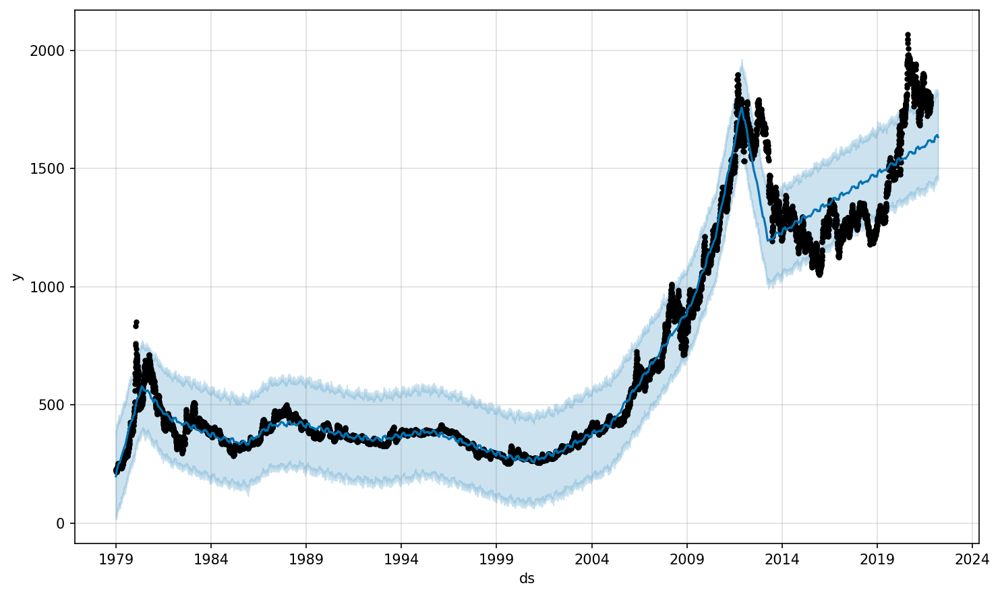

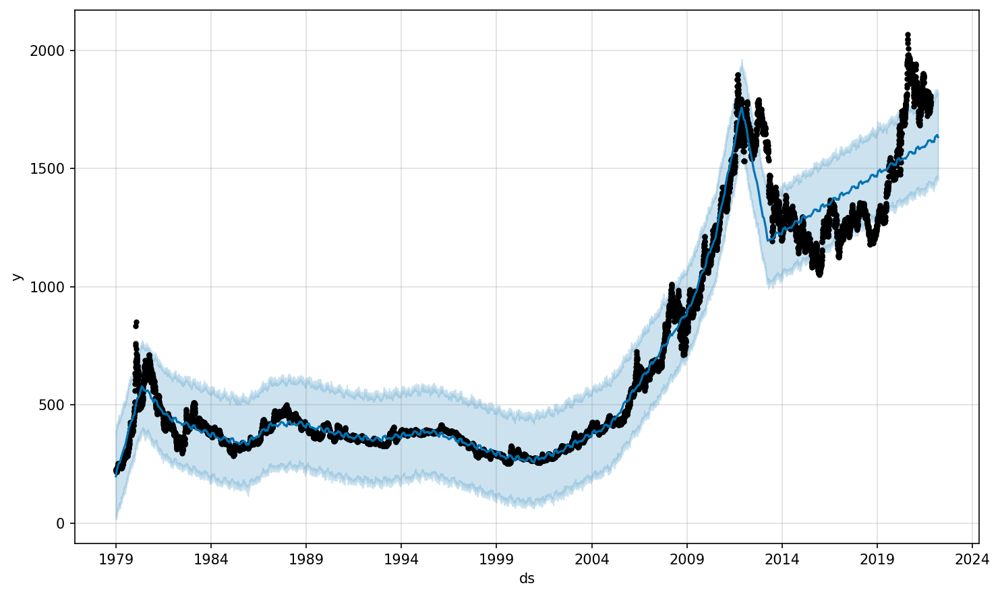

In [994]:
model_prophet.plot(forecast_prophet, uncertainty=True)

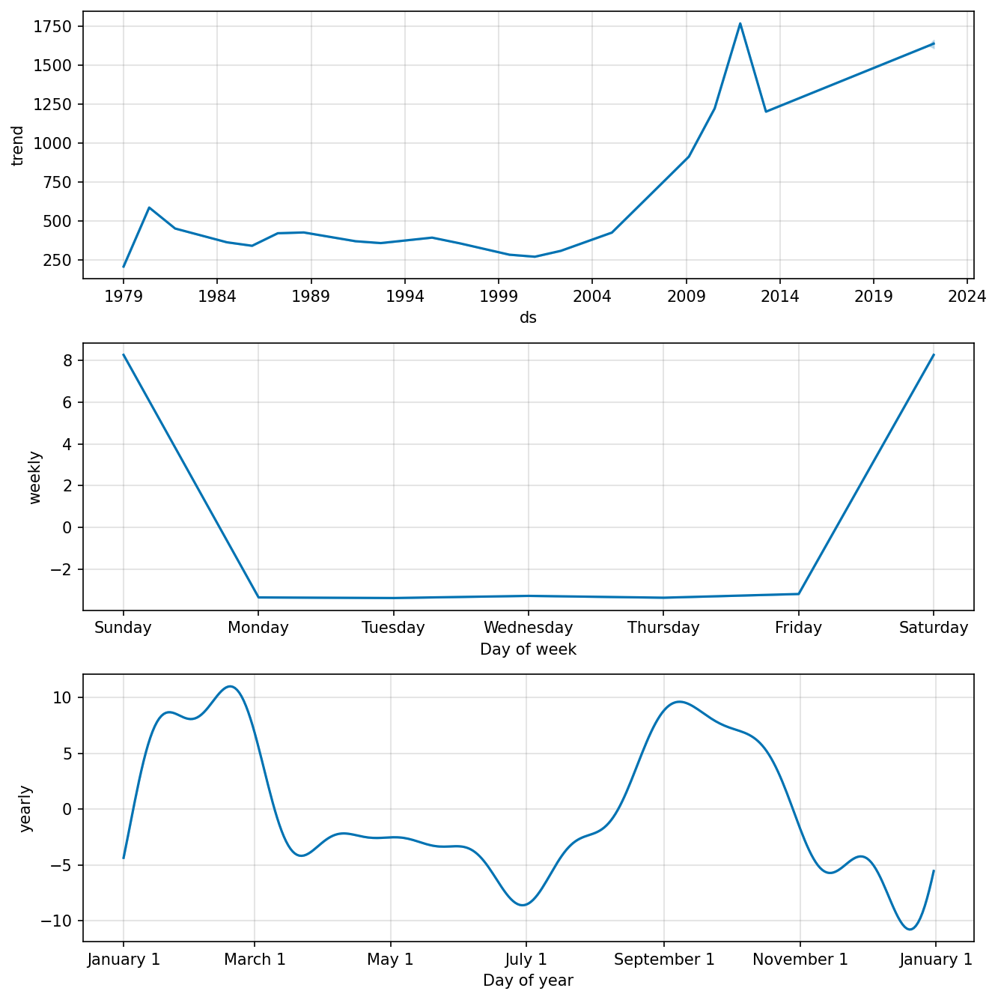

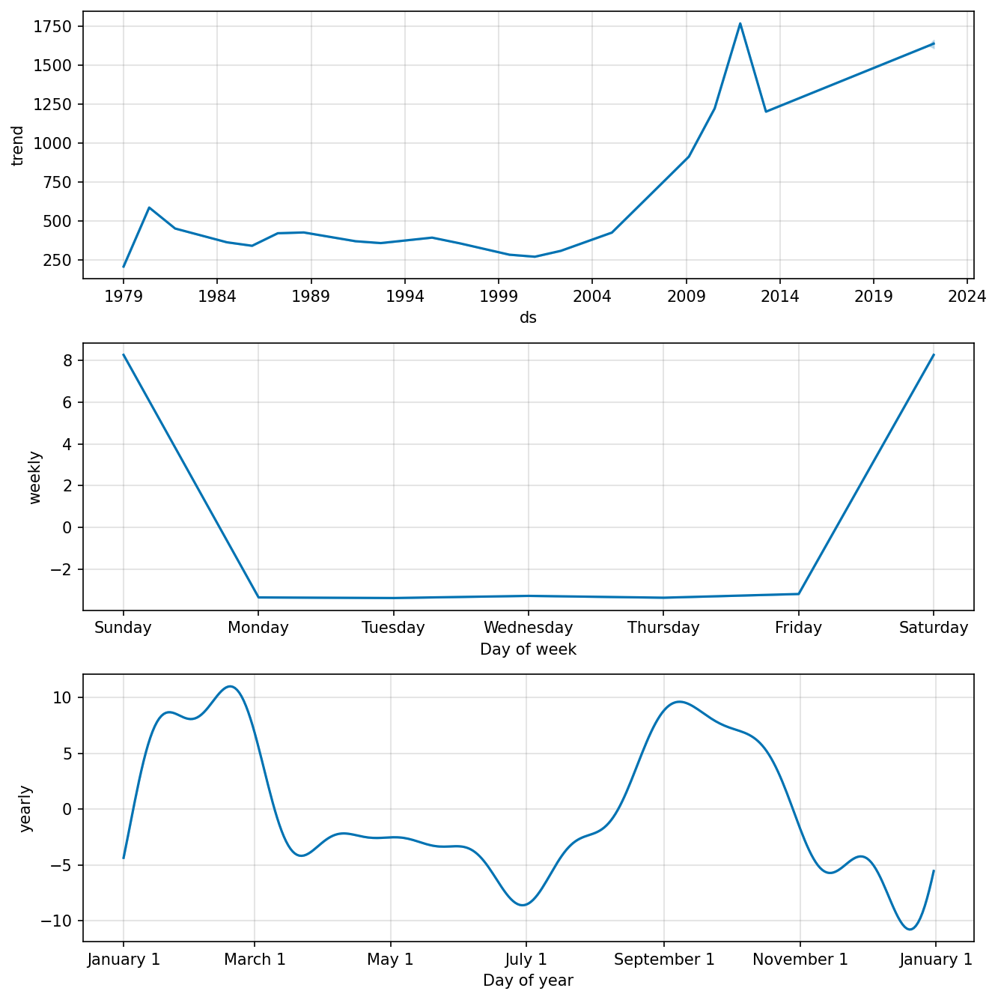

In [995]:
model_prophet.plot_components(forecast_prophet)

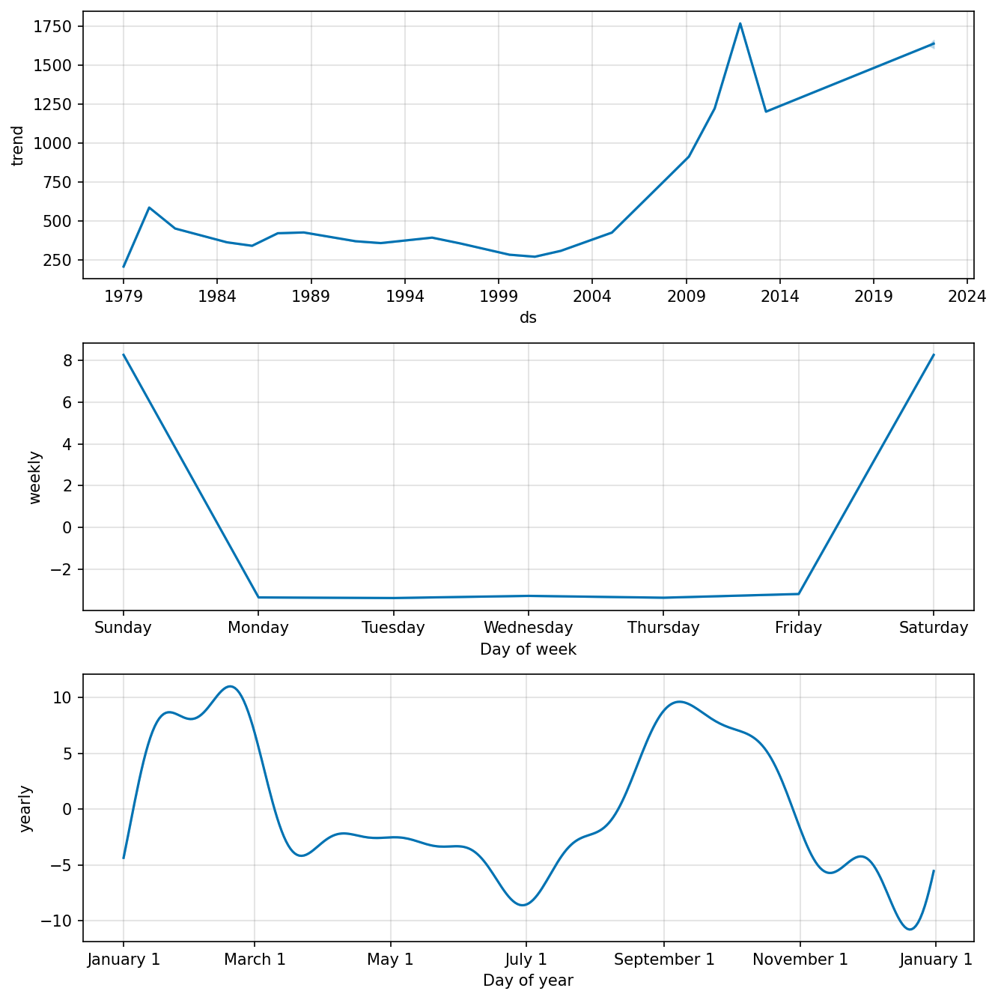

In [996]:
fig1 = model_prophet.plot_components(forecast_prophet)

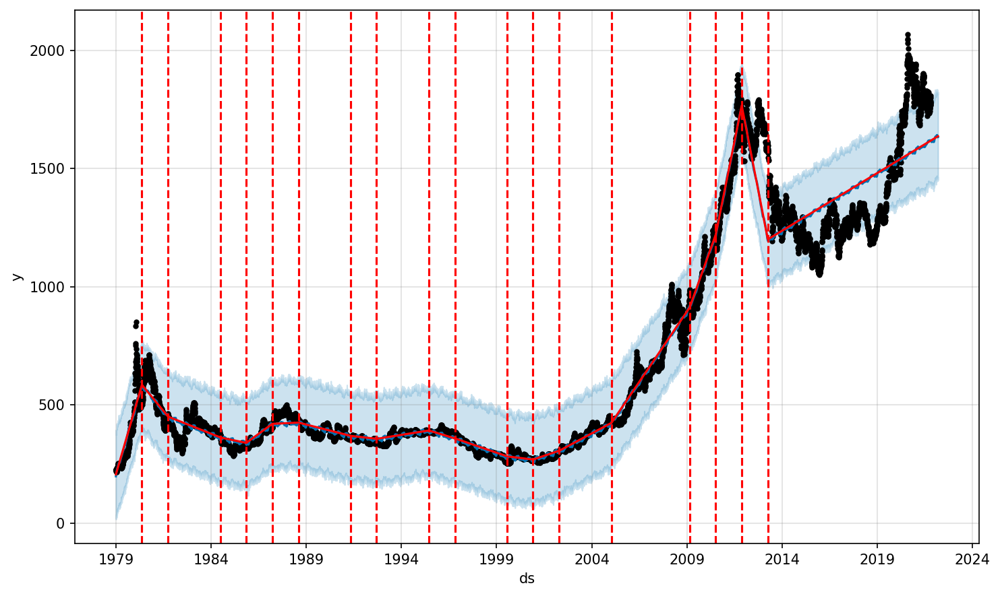

In [997]:
from fbprophet.plot import add_changepoints_to_plot
fig = model_prophet.plot(forecast_prophet)
a = add_changepoints_to_plot(fig.gca(), model_prophet, forecast_prophet)

Report the MAE, MAPE and RMSE accuracy

In [999]:
total_prophet = len(forecast_prophet['yhat'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size_prophet = total_prophet - 100
mae = metrics.mean_absolute_error(X_test_prophet['y'], forecast_prophet['yhat'].iloc[train_size_prophet:])
mape = metrics.mean_absolute_percentage_error(X_test_prophet['y'], forecast_prophet['yhat'].iloc[train_size_prophet:])
mse = metrics.mean_squared_error(X_test_prophet['y'], forecast_prophet['yhat'].iloc[train_size_prophet:])
rmse = np.sqrt(mse)

In [1000]:
print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

Results of sklearn.metrics:
MAE: 207.05432915703798
MAPE: 0.11234507278345587
RMSE: 213.32105737127216


In [1001]:
model_prophet.changepoints

357    1980-05-14
715    1981-09-28
1072   1983-02-09
1430   1984-06-25
1787   1985-11-06
2144   1987-03-20
2502   1988-08-03
2859   1989-12-15
3217   1991-05-01
3574   1992-09-11
3931   1994-01-25
4289   1995-06-09
4646   1996-10-22
5004   1998-03-06
5361   1999-07-20
5718   2000-11-30
6076   2002-04-16
6433   2003-08-28
6791   2005-01-11
7148   2006-05-25
7505   2007-10-08
7863   2009-02-19
8220   2010-07-05
8578   2011-11-17
8935   2013-04-01
Name: ds, dtype: datetime64[ns]

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


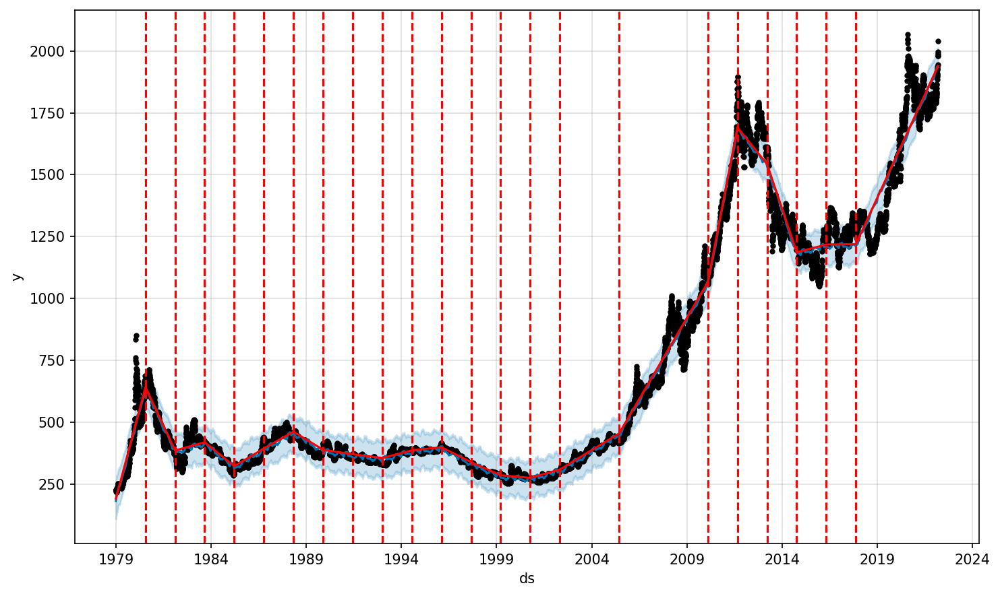

In [1002]:
pro_change= Prophet(changepoint_range=0.9)
forecast_prophet_1 = pro_change.fit(df_prophet).predict(future_dates_prophet)
fig= pro_change.plot(forecast_prophet_1);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast_prophet_1)

Report the MAE, MAPE and RMSE accuracy

In [1003]:
total_prophet = len(forecast_prophet_1['yhat'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size_prophet = total_prophet - 100
mae = metrics.mean_absolute_error(X_test_prophet['y'], forecast_prophet_1['yhat'].iloc[train_size_prophet:])
mape = metrics.mean_absolute_percentage_error(X_test_prophet['y'], forecast_prophet_1['yhat'].iloc[train_size_prophet:])
mse = metrics.mean_squared_error(X_test_prophet['y'], forecast_prophet_1['yhat'].iloc[train_size_prophet:])
rmse = np.sqrt(mse)

In [1004]:
print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

Results of sklearn.metrics:
MAE: 78.96715094052581
MAPE: 0.043529784015736206
RMSE: 85.78999301156486


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


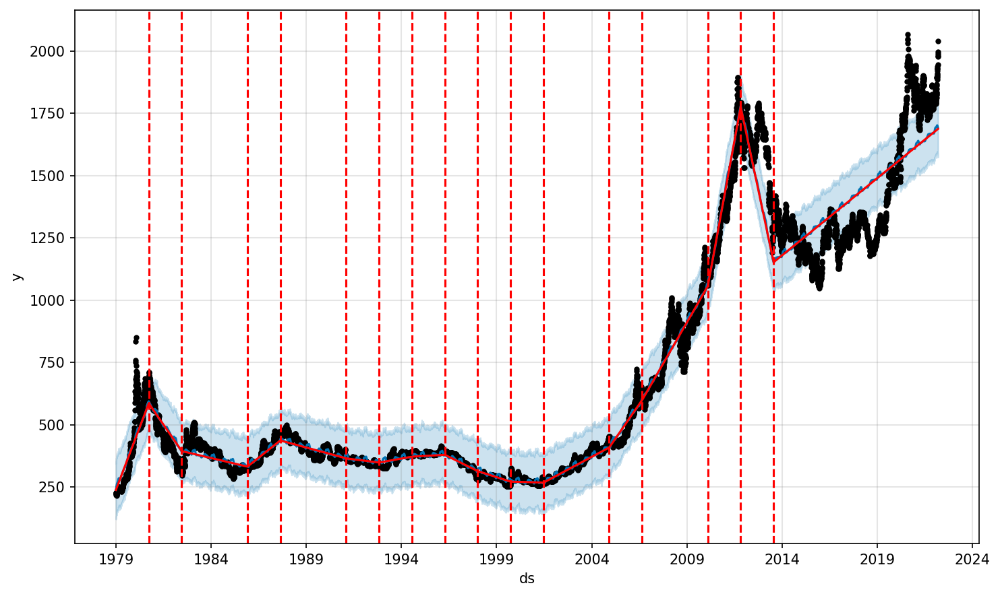

In [1005]:
pro_change= Prophet(n_changepoints=20, yearly_seasonality=True)
forecast_prophet_2 = pro_change.fit(df_prophet).predict(future_dates_prophet)
fig= pro_change.plot(forecast_prophet_2);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast_prophet_2)

Report the MAE, MAPE and RMSE accuracy

In [1006]:
total_prophet = len(forecast_prophet_2['yhat'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size_prophet = total_prophet - 100
mae = metrics.mean_absolute_error(X_test_prophet['y'], forecast_prophet_2['yhat'].iloc[train_size_prophet:])
mape = metrics.mean_absolute_percentage_error(X_test_prophet['y'], forecast_prophet_2['yhat'].iloc[train_size_prophet:])
mse = metrics.mean_squared_error(X_test_prophet['y'], forecast_prophet_2['yhat'].iloc[train_size_prophet:])
rmse = np.sqrt(mse)

In [1007]:
print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

Results of sklearn.metrics:
MAE: 149.40034443963324
MAPE: 0.08086092158261092
RMSE: 157.5465299968472


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


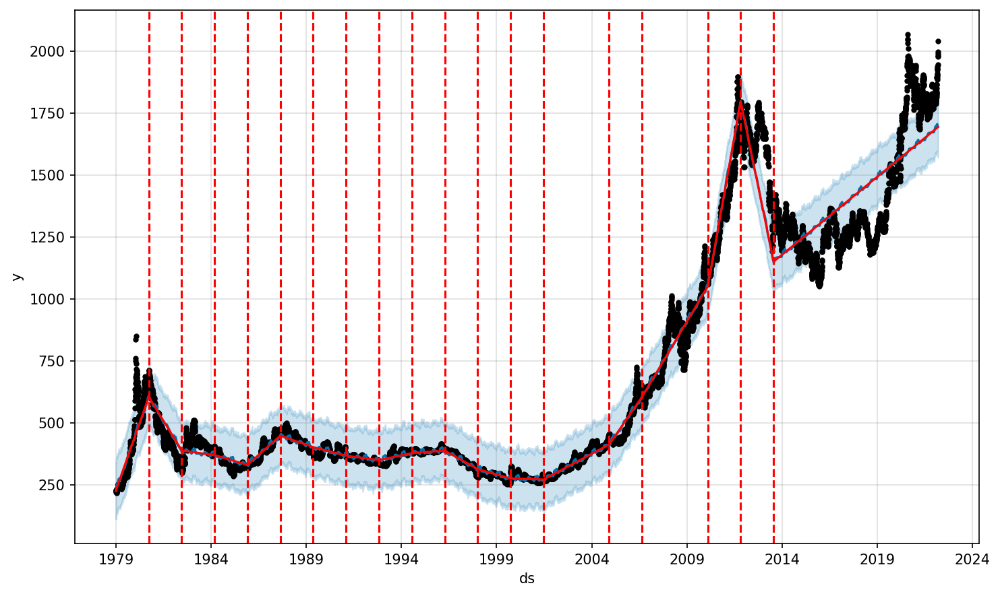

In [1008]:
pro_change= Prophet(n_changepoints=20, yearly_seasonality=True, changepoint_prior_scale=0.08)
forecast_prophet_3 = pro_change.fit(df_prophet).predict(future_dates_prophet)
fig= pro_change.plot(forecast_prophet_3);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast_prophet_3)

Report the MAE, MAPE and RMSE accuracy

In [1009]:
total_prophet = len(forecast_prophet_3['yhat'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size_prophet = total_prophet - 100
mae = metrics.mean_absolute_error(X_test_prophet['y'], forecast_prophet_3['yhat'].iloc[train_size_prophet:])
mape = metrics.mean_absolute_percentage_error(X_test_prophet['y'], forecast_prophet_3['yhat'].iloc[train_size_prophet:])
mse = metrics.mean_squared_error(X_test_prophet['y'], forecast_prophet_3['yhat'].iloc[train_size_prophet:])
rmse = np.sqrt(mse)

In [1010]:
print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

Results of sklearn.metrics:
MAE: 146.721100180583
MAPE: 0.07939885779996744
RMSE: 154.98053070806205


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


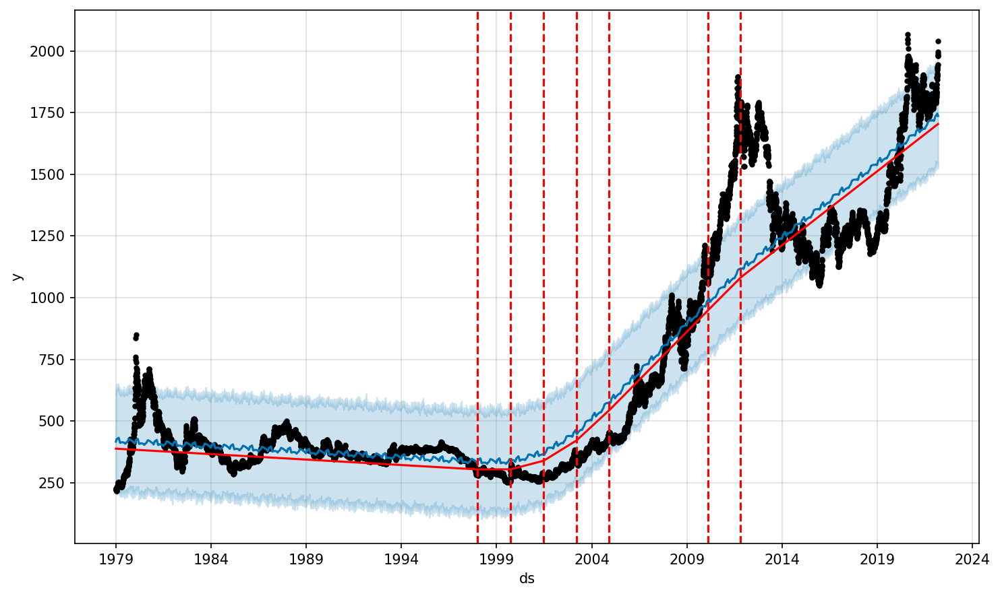

In [1011]:
pro_change= Prophet(n_changepoints=20, yearly_seasonality=True, changepoint_prior_scale=0.001)
forecast_prophet_4 = pro_change.fit(df_prophet).predict(future_dates_prophet)
fig= pro_change.plot(forecast_prophet_4);
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast_prophet_4)

Report the MAE, MAPE and RMSE accuracy

In [1012]:
total_prophet = len(forecast_prophet_4['yhat'])

# We need to validate on most-recent 100 days.
# Hence, Train on remaining days and test on the most recent 100 days.
train_size_prophet = total_prophet - 100
mae = metrics.mean_absolute_error(X_test_prophet['y'], forecast_prophet_4['yhat'].iloc[train_size_prophet:])
mape = metrics.mean_absolute_percentage_error(X_test_prophet['y'], forecast_prophet_4['yhat'].iloc[train_size_prophet:])
mse = metrics.mean_squared_error(X_test_prophet['y'], forecast_prophet_4['yhat'].iloc[train_size_prophet:])
rmse = np.sqrt(mse)

In [1013]:
print("Results of sklearn.metrics:")
print("MAE:",mae)
print("MAPE:", mape)
print("RMSE:", rmse)

Results of sklearn.metrics:
MAE: 103.51710229184698
MAPE: 0.05576820032634388
RMSE: 115.26537478170414


In [1014]:
df_d

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
Date,,,,,,,,,,,,,,,,,,,
1979-01-01,226.00,137.06,43164.91,110.70,263.74,359.62,1792.85,835.80,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1979-01-02,226.80,137.29,43164.91,111.45,263.74,359.62,1792.85,835.80,0.08,735.60,138160.45,851.29,4454.55,1842229.16,995.19,107470.04,132.71,194.56,193.61
1979-01-03,218.60,134.01,43717.90,107.98,264.39,365.87,1802.15,835.80,0.08,739.42,138877.01,855.71,4477.66,1842229.16,995.19,108027.43,132.71,192.23,192.97
1979-01-04,223.15,136.79,43674.89,110.66,264.14,366.38,1811.74,835.80,0.08,743.36,139616.26,860.26,4501.49,1842229.16,995.19,108602.47,132.71,193.01,194.55
1979-01-05,225.50,138.35,44582.47,111.63,268.39,373.72,1843.57,835.80,0.08,756.42,142069.10,875.38,4580.57,1842229.16,995.19,110510.44,132.71,196.40,197.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-07,1980.95,1821.48,228571.91,1508.09,2529.77,1833.86,152468.77,12516.24,28505.87,7432.52,28540536.42,7276.13,65311.92,45264706.38,31180.15,2430724.64,300113.92,30313.49,2703.08
2022-03-08,2039.05,1874.56,235714.19,1555.28,2623.75,1894.28,156815.69,12874.97,29729.35,7650.31,29357223.08,7489.63,67625.09,46587195.99,32033.48,2522508.82,267115.56,31207.66,2806.87
2022-03-09,1988.90,1800.64,230344.44,1511.72,2548.87,1843.21,152282.61,12562.39,29152.30,7461.76,28537730.25,7305.33,65772.92,45421501.52,31245.62,2460468.07,269495.94,29885.71,2718.00


**Prediction of next 20 days**

The Best model is the one with the least error.

MLP Regressor with True Lag features gives the least error. But we cannot use it to predict upcoming 20 days with it because we do not have the true lag features of future days.

From the remaining models, ARIMA model is giving the least error.

Hence, we will use the ARIMA model.

In [1015]:
df_pred = df_d.copy()

In [1016]:
df_pred.tail()

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
Date,,,,,,,,,,,,,,,,,,,
2022-03-07,1980.95,1821.48,228571.91,1508.09,2529.77,1833.86,152468.77,12516.24,28505.87,7432.52,28540536.42,7276.13,65311.92,45264706.38,31180.15,2430724.64,300113.92,30313.49,2703.08
2022-03-08,2039.05,1874.56,235714.19,1555.28,2623.75,1894.28,156815.69,12874.97,29729.35,7650.31,29357223.08,7489.63,67625.09,46587195.99,32033.48,2522508.82,267115.56,31207.66,2806.87
2022-03-09,1988.90,1800.64,230344.44,1511.72,2548.87,1843.21,152282.61,12562.39,29152.30,7461.76,28537730.25,7305.33,65772.92,45421501.52,31245.62,2460468.07,269495.94,29885.71,2718.00
2022-03-10,1996.60,1812.04,231535.73,1520.81,2552.35,1851.75,152350.57,12622.21,29589.61,7490.25,28511449.39,7333.61,66182.30,45602346.23,31416.50,2452324.07,261554.61,30071.29,2712.96
2022-03-11,1978.70,1804.31,231498.00,1512.02,2513.05,1845.83,151561.00,12511.02,29128.44,7423.09,28300356.05,7267.86,65880.81,45268697.48,31045.80,2437659.41,264898.46,29680.50,2703.33


In [1017]:
df_pred.columns

Index(['US dollar (USD)', 'Euro (EUR)', 'Japanese yen (JPY)',
       'Pound sterling (GBP)', 'Canadian dollar (CAD)', 'Swiss franc (CHF)',
       'Indian rupee (INR)', 'Chinese renmimbi (CNY)', 'Turkish lira (TRY)',
       'Saudi riyal (SAR)', 'Indonesian rupiah (IDR)', 'UAE dirham (AED)',
       'Thai baht THB)', 'Vietnamese dong (VND)', 'Egyptian pound (EGP)',
       'Korean won (KRW)', 'Russian ruble (RUB)', 'South African rand (ZAR)',
       'Australian dollar (AUD)'],
      dtype='object')

In [1018]:
currency = df_pred.columns.tolist()
currency

['US dollar (USD)',
 'Euro (EUR)',
 'Japanese yen (JPY)',
 'Pound sterling (GBP)',
 'Canadian dollar (CAD)',
 'Swiss franc (CHF)',
 'Indian rupee (INR)',
 'Chinese renmimbi (CNY)',
 'Turkish lira (TRY)',
 'Saudi riyal (SAR)',
 'Indonesian rupiah (IDR)',
 'UAE dirham (AED)',
 'Thai baht THB)',
 'Vietnamese dong (VND)',
 'Egyptian pound (EGP)',
 'Korean won (KRW)',
 'Russian ruble (RUB)',
 'South African rand (ZAR)',
 'Australian dollar (AUD)']

In [1019]:
X_test_pred = pd.date_range(start=list(df_pred.index)[-1], periods=21, freq='D')
X_test_pred

DatetimeIndex(['2022-03-11', '2022-03-12', '2022-03-13', '2022-03-14',
               '2022-03-15', '2022-03-16', '2022-03-17', '2022-03-18',
               '2022-03-19', '2022-03-20', '2022-03-21', '2022-03-22',
               '2022-03-23', '2022-03-24', '2022-03-25', '2022-03-26',
               '2022-03-27', '2022-03-28', '2022-03-29', '2022-03-30',
               '2022-03-31'],
              dtype='datetime64[ns]', freq='D')

In [1020]:
predictions = {}

# For all currencies, we will train a model and give predictions.
for c in currency:

  X_train_pred = df_pred[c]
  
  # Create and Train model on X_train
  arima_model=ARIMA(X_train_pred ,order=(1,1,0))  #ARIMA(data,order=(p =1,d=1,q=0))
  arima_model_fit=arima_model.fit()

  # Make Predictions for X_test
  fc, se, conf = arima_model_fit.forecast(len(X_test_pred), alpha=0.05)  # 95% conf

  # Make as pandas series
  fc_series = pd.Series(fc, index=X_test_pred)
  lower_series = pd.Series(conf[:, 0], index=X_test_pred)
  upper_series = pd.Series(conf[:, 1], index=X_test_pred)  

  predictions[c] = {
      "Forecast": fc_series,
      "Lower Confidence Level": lower_series,
      "Upper Confidence Level": upper_series
  }

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency B will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred f

In [1021]:
forecast_predictions = {}
for c in currency:
  forecast_predictions[c] = predictions[c]['Forecast']

In [1022]:
predictions_df = pd.DataFrame.from_dict(forecast_predictions)

In [1023]:
predictions_df

,US dollar (USD),Euro (EUR),Japanese yen (JPY),Pound sterling (GBP),Canadian dollar (CAD),Swiss franc (CHF),Indian rupee (INR),Chinese renmimbi (CNY),Turkish lira (TRY),Saudi riyal (SAR),Indonesian rupiah (IDR),UAE dirham (AED),Thai baht THB),Vietnamese dong (VND),Egyptian pound (EGP),Korean won (KRW),Russian ruble (RUB),South African rand (ZAR),Australian dollar (AUD)
2022-03-11,1979.194266,1804.770887,231517.509543,1512.407414,2515.314228,1846.395901,151584.954958,12514.704739,29167.064680,7425.987360,2.830832e+07,7270.703479,65903.810545,4.527550e+07,30998.942781,2.438423e+06,264721.888869,29690.459087,2704.268751
2022-03-12,1979.343472,1804.906436,231534.078335,1512.524025,2515.406108,1846.496711,151598.103574,12515.678275,29166.850634,7426.502667,2.831068e+07,7271.195148,65908.258034,4.527933e+07,30995.037786,2.438609e+06,264757.438801,29692.938601,2704.439512
2022-03-13,1979.499152,1805.054907,231550.798211,1512.648626,2515.611526,1846.630872,151611.395734,12516.715800,29169.654720,7427.098967,2.831318e+07,7271.767453,65913.766311,4.528318e+07,30996.829670,2.438817e+06,264780.207494,29695.557713,2704.666079
2022-03-14,1979.654710,1805.202864,231567.510325,1512.772992,2515.811009,1846.762642,151624.685988,12517.751815,29172.224269,7427.692513,2.831568e+07,7272.336993,65919.213937,4.528704e+07,30999.377148,2.439023e+06,264803.746313,29698.174220,2704.888591
2022-03-15,1979.810270,1805.350842,231584.222839,1512.897365,2516.010803,1846.894583,151637.976267,12518.787865,29174.812044,7428.286153,2.831818e+07,7272.906628,65924.665031,4.529089e+07,31002.024843,2.439230e+06,264827.238729,29700.790775,2705.111398
2022-03-16,1979.965830,1805.498820,231600.935331,1513.021737,2516.210580,1847.026512,151651.266545,12519.823914,29177.398403,7428.879789,2.832068e+07,7273.476259,65930.115926,4.529475e+07,31004.685830,2.439437e+06,264850.733940,29703.407330,2705.334183
2022-03-17,1980.121390,1805.646797,231617.647825,1513.146110,2516.410358,1847.158441,151664.556824,12520.859963,29179.984871,7429.473426,2.832318e+07,7274.045891,65935.566832,4.529860e+07,31007.348580,2.439644e+06,264874.228984,29706.023885,2705.556970
2022-03-18,1980.276950,1805.794775,231634.360318,1513.270482,2516.610137,1847.290371,151677.847103,12521.896013,29182.571331,7430.067063,2.832568e+07,7274.615522,65941.017738,4.530245e+07,31010.011564,2.439851e+06,264897.724037,29708.640439,2705.779757
2022-03-19,1980.432510,1805.942752,231651.072812,1513.394855,2516.809915,1847.422300,151691.137381,12522.932062,29185.157792,7430.660700,2.832818e+07,7275.185154,65946.468645,4.530631e+07,31012.674578,2.440057e+06,264921.219090,29711.256994,2706.002543
2022-03-20,1980.588071,1806.090729,231667.785305,1513.519227,2517.009693,1847.554230,151704.427660,12523.968112,29187.744253,7431.254337,2.833068e+07,7275.754785,65951.919551,4.531016e+07,31015.337597,2.440264e+06,264944.714142,29713.873548,2706.225330


In [1024]:
#plot_interactive(predictions_df, currencies, plot_title='Predictions for 20 days (without confidence intervals)')

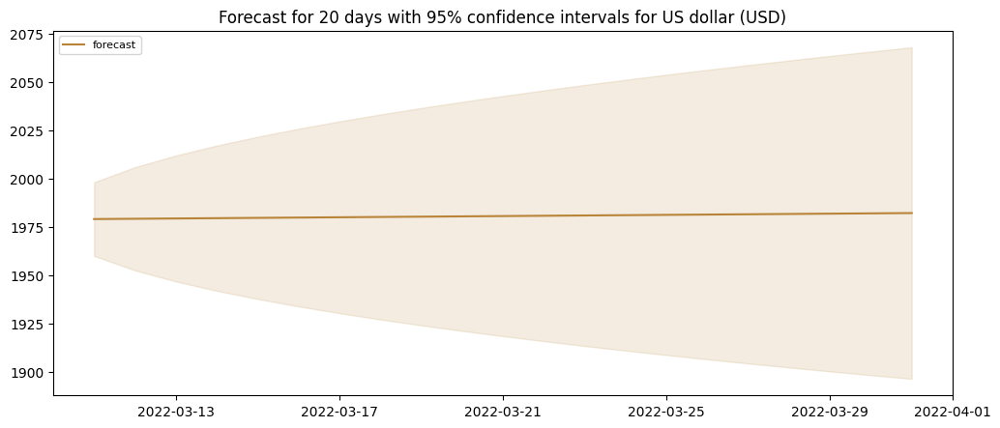

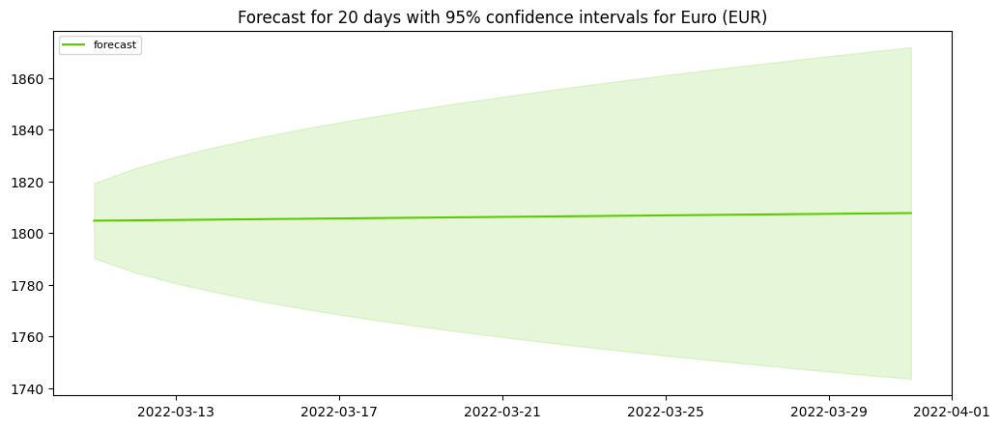

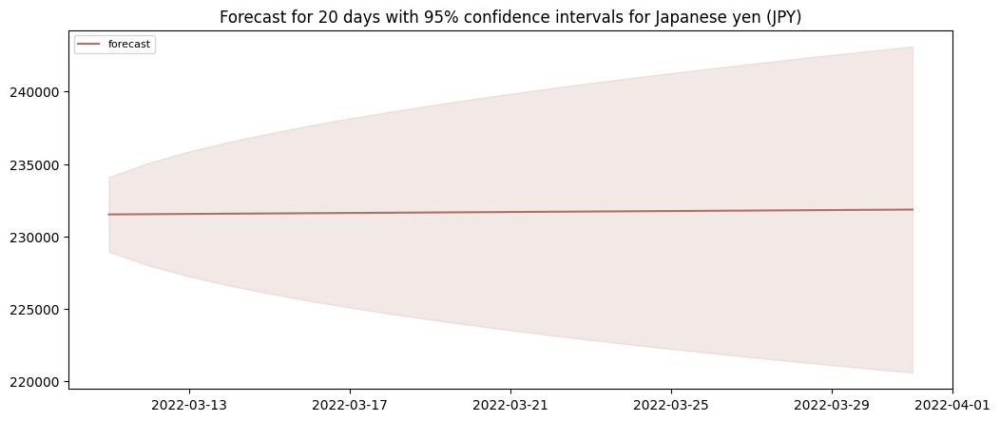

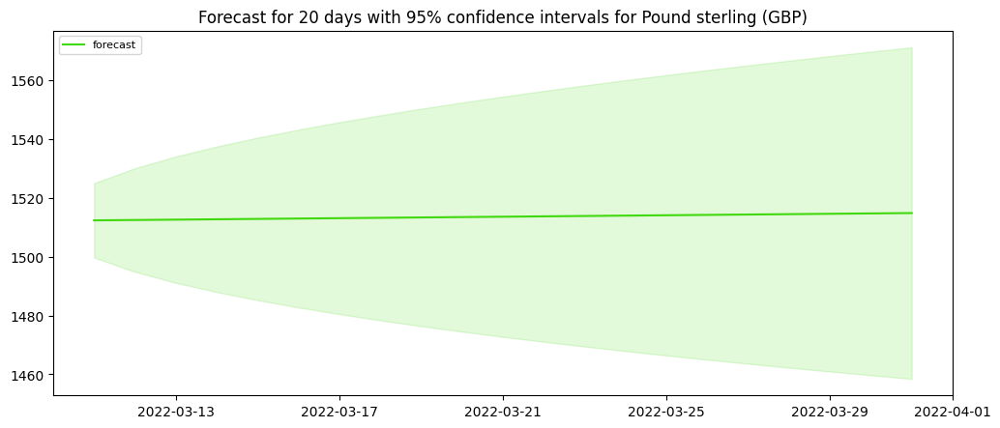

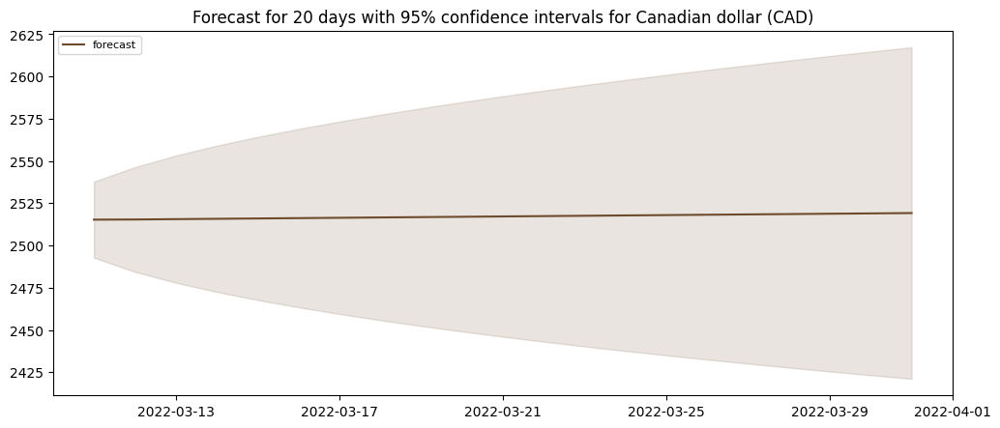

...

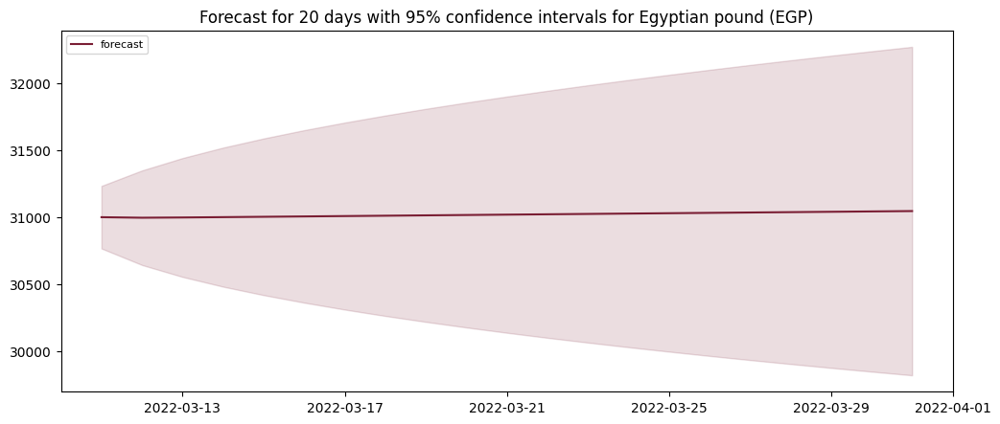

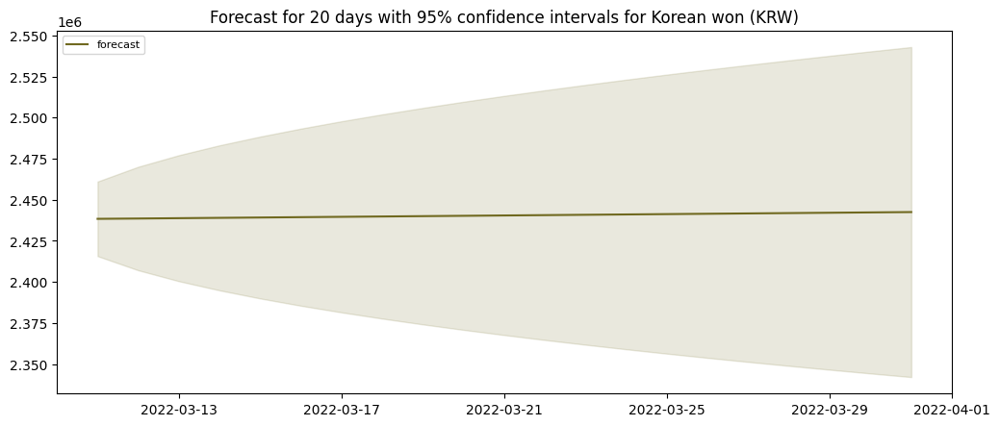

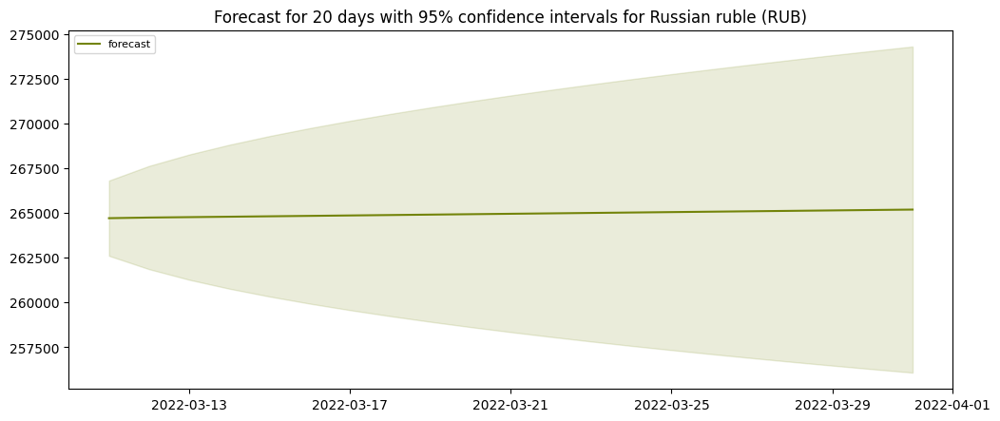

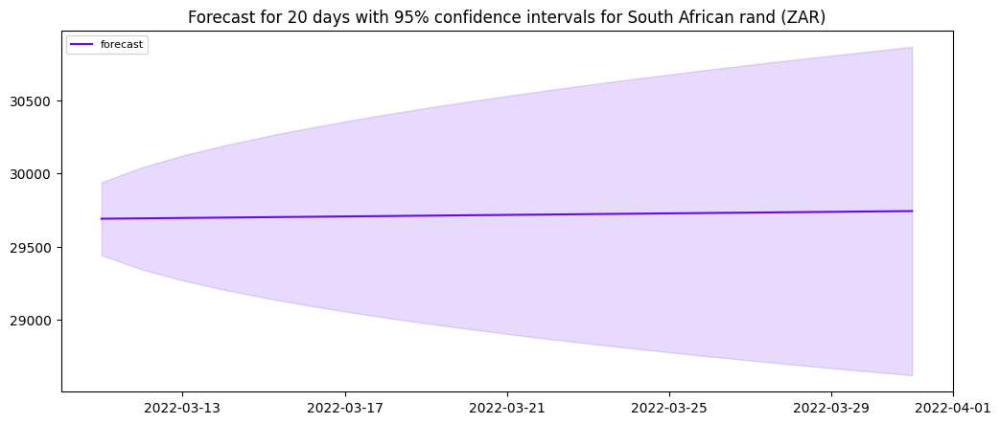

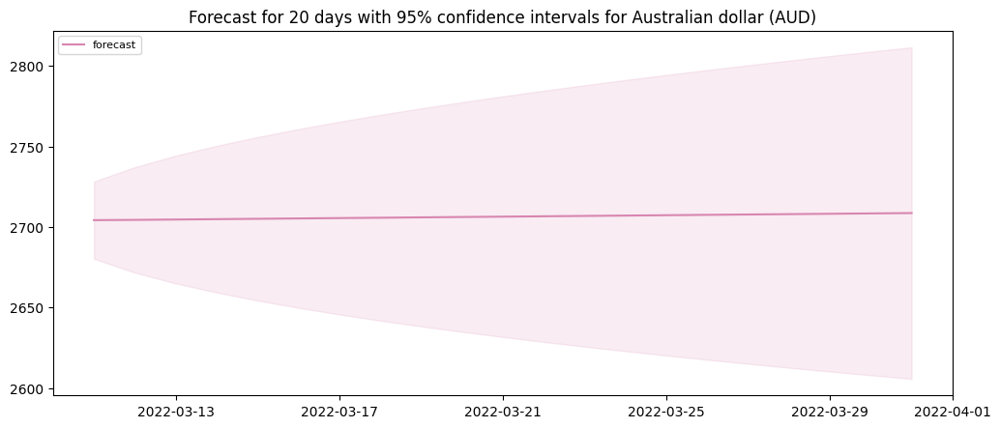

In [1026]:
for c in currency:
  lower_series = predictions[c]['Lower Confidence Level']
  upper_series = predictions[c]['Upper Confidence Level']

  r1 = "#{:06x}".format(np.random.randint(0, 0xFFFFFF))

  plt.figure(figsize=(12,5), dpi=100)
  plt.plot(predictions[c]['Forecast'], label='forecast', color=r1)
  plt.fill_between(lower_series.index, lower_series, upper_series, 
                  color=r1, alpha=.15)
  plt.title(f'Forecast for 20 days with 95% confidence intervals for {c}')
  plt.legend(loc='upper left', fontsize=8)
  plt.show()